## Run this to get metrics for all of the crops

In [22]:
import pandas as pd
import os
import tifffile
import numpy as np

In [46]:
# helper function to create a df of filepaths for ground truth and segmentation results
def get_filepath_df(GT_dir, segmentation_dir, models, samples, cropID_range=range(1, 5)):
    """
    Creates a DataFrame with file paths for ground truth and segmentation results.

    Parameters:
    - models: List of model names.
    - samples: List of sample names.
    - cropID_range: Range of crop IDs to include in the file paths.

    Returns:
    - DataFrame with columns 'GT' and 'segmentation'.
    """
    data = []

    for model in models:
        seg_tool, seg_model = model.split("_")
        for sample in samples:
            for cropID in cropID_range:
                gt_path = f'{GT_dir}/{sample}_GT_crop{cropID}.tif'
                seg_path = f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'
                data.append({'GT': gt_path, 'segmentation': seg_path, 'model':model})

    return pd.DataFrame(data)

In [47]:
GT_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations'
models = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
segmentation_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/segmentation'
samples = ["_".join((os.path.splitext(os.path.basename(file))[0].split('_')[0], os.path.splitext(os.path.basename(file))[0].split('_')[1])) for file in os.listdir(GT_dir)]
samples = list(set(samples))
samples = [sample for sample in samples if sample != '.DS_Store']

crop_df = get_filepath_df(GT_dir, segmentation_dir, models, samples)
crop_df['id'] = crop_df.segmentation.apply(lambda x: x.split('/')[-1].split('.')[0])
# use lambda to extract sampleID from the id - 1,2,4
crop_df['sampleID'] = [x.split('_')[1] + '_' + x.split('_')[2] + '_' + x.split('_')[4] for x in crop_df.id]

# check that all files exist
for _, row in crop_df.iterrows():
    if not os.path.exists(row['GT']):
        print(f"Ground truth file does not exist: {row['GT']}")
    if not os.path.exists(row['segmentation']):
        print(f"Segmentation file does not exist: {row['segmentation']}")

Row cellpose_4h_96_custom_crop3 has no background (pixels set to 0) in GT: /Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations/4h_96_GT_crop3.tif


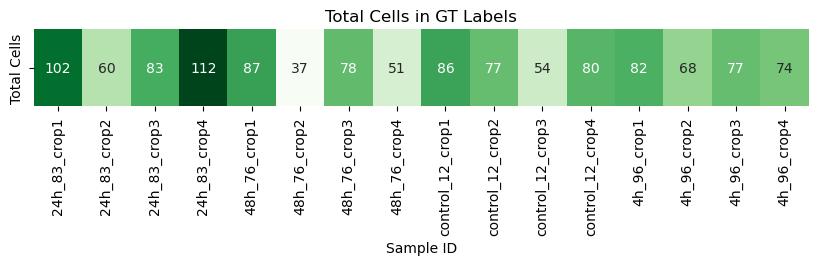

In [45]:
# plots total number of cells per ground truth crop
crop_df_subset = crop_df[crop_df['model'] == 'cellpose_custom']
import matplotlib.pyplot as plt
import seaborn as sns

total_cells = []
for _, row in crop_df_subset.iterrows():
    gt_label = tifffile.imread(row['GT'])
    cells = np.unique(gt_label)
    # if 0 is not in cells, print row
    if 0 not in cells:
        print(f"Row {row['id']} has no background (pixels set to 0) in GT: {row['GT']}")
    cells = cells[cells != 0]
    total_cells.append(cells.size)

plt.figure(figsize=(10, 1))
sns.heatmap(np.array(total_cells).reshape(1, -1), annot=True, fmt='d', cmap='Greens', cbar=False, xticklabels=crop_df_subset['sampleID'], yticklabels=['Total Cells'])
plt.xlabel('Sample ID')
plt.title('Total Cells in GT Labels')
plt.xticks(rotation=90)
plt.show()

In [96]:
# functions for segmentation evaluation, and plotting
import numpy as np
from scipy.stats import hmean
import networkx as nx

def evaluate_segmentation_metrics(gt, pred, iou_threshold=0.5, graph_iou_threshold=0.1, unmatched_cost=0.4):
    """
    Evaluate segmentation performance on one labeled image pair.

    Parameters:
        gt (ndarray): Labeled ground truth image (2D)
        pred (ndarray): Labeled prediction image (2D)
        iou_threshold (float): Minimum IoU to consider a match

    Returns:
        dict with:
            - iou_list: list of IoUs for matched cells
            - dice_list: list of Dice scores for matched cells
            - mean_precision, mean_recall, mean_f1
            - n_splits, n_merges, n_catastrophes
    """

    gt_ids = np.unique(gt)
    pred_ids = np.unique(pred)
    gt_ids = gt_ids[gt_ids != 0]
    pred_ids = pred_ids[pred_ids != 0]
    gt_labels = len(gt_ids)
    pred_labels = len(pred_ids)

    iou_matrix = np.zeros((len(gt_ids), len(pred_ids)))
    iou_graph = nx.Graph()

    # Computes IoU matrix and build graph
    for i, gt_id in enumerate(gt_ids):
        gt_mask = gt == gt_id
        for j, pred_id in enumerate(pred_ids):
            pred_mask = pred == pred_id
            intersection = np.logical_and(gt_mask, pred_mask).sum()
            union = np.logical_or(gt_mask, pred_mask).sum()
            iou = intersection / union if union > 0 else 0
            iou_matrix[i, j] = iou
            if iou > graph_iou_threshold:
                iou_graph.add_edge(f'gt_{gt_id}', f'pred_{pred_id}', weight=1 - iou)

    # Construct full cost matrix ()
    n = gt_labels + pred_labels
    cost_matrix = np.ones((n, n))

    cost_matrix[:gt_labels, :pred_labels] = 1 - iou_matrix     # A: Top-left block = real costs
    cost_matrix[gt_labels:, pred_labels:] = (1 - iou_matrix).T     # D: Bottom-right = transpose of A
    top_right = unmatched_cost * np.eye(gt_labels) + (1 - np.eye(gt_labels))
    cost_matrix[:gt_labels, pred_labels:] = top_right     # B: Top-right = unmatched GTs
    bottom_left = unmatched_cost * np.eye(pred_labels) + (1 - np.eye(pred_labels))
    cost_matrix[gt_labels:, :pred_labels] = bottom_left     # C: Bottom-left = unmatched preds

    # Step 3: Solve the assignment problem
    from scipy.optimize import linear_sum_assignment
    order_res = linear_sum_assignment(cost_matrix)
    order_mat = np.zeros_like(cost_matrix)
    order_mat[order_res] = 1

    order_ind = np.nonzero(order_mat[:gt_labels, :pred_labels])
    row_ind = order_ind[0]
    col_ind = order_ind[1]

    matched_pairs = []
    iou_list = []
    dice_list = []

    matched_gt = set()
    matched_pred = set()
    for i, j in zip(row_ind, col_ind):
        if iou_matrix[i, j] >= iou_threshold:
            gt_id = gt_ids[i]
            pred_id = pred_ids[j]
            matched_pairs.append((gt_id, pred_id))
            matched_gt.add(gt_id)
            matched_pred.add(pred_id)

            gt_mask = gt == gt_id
            pred_mask = pred == pred_id
            intersection = np.logical_and(gt_mask, pred_mask).sum()
            union = np.logical_or(gt_mask, pred_mask).sum()
            dice = (2 * intersection) / (gt_mask.sum() + pred_mask.sum()) if (gt_mask.sum() + pred_mask.sum()) > 0 else 0

            iou_list.append(iou_matrix[i, j])
            dice_list.append(dice)

    # Classify graph-based errors (for all cells with nonzero overlap)
    splits = 0
    merges = 0
    catastrophes = 0

    split_details = []
    merge_details = []
    catastrophe_details = []

    # drop nodes where preds are in matched_pred and gts are in matched_gt
    iou_graph.remove_nodes_from([n for n in iou_graph.nodes if (n.startswith("pred_") and int(n.split("_")[1]) in matched_pred) or (n.startswith("gt_") and int(n.split("_")[1]) in matched_gt)])

    for component in nx.connected_components(iou_graph):
        gts = {n for n in component if n.startswith("gt_")}
        preds = {n for n in component if n.startswith("pred_")}

        ng = len(gts)
        np_ = len(preds)

        gt_nodes = {int(g.split("_")[1]) for g in gts}
        pred_nodes = {int(p.split("_")[1]) for p in preds}

        if ng == 1 and np_ == 1:
            continue  # match
        elif ng == 1 and np_ > 1:
            splits += 1
            split_details.append({
                "gt": list(gt_nodes)[0],
                "preds": sorted(list(pred_nodes))
            })
        elif ng > 1 and np_ == 1:
            merges += 1
            merge_details.append({
                "pred": list(pred_nodes)[0],
                "gts": sorted(list(gt_nodes))
            })
        elif ng > 1 and np_ > 1:
            catastrophes += 1
            catastrophe_details.append({
                "gts": sorted(list(gt_nodes)),
                "preds": sorted(list(pred_nodes))
            })

    # Identify unmatched cells
    false_negatives = len(gt_ids) - len(matched_gt)
    false_positives = len(pred_ids) - len(matched_pred)
    true_positives = len(matched_pairs)

    fp_preds = set(pred_ids) - matched_pred
    fn_gts = set(gt_ids) - matched_gt
    ttp_gts = matched_gt
    ttp_preds = matched_pred

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
    f1 = hmean([precision, recall]) if precision > 0 and recall > 0 else 0

    return {
        "iou_list": iou_list,
        "iou_mean": np.mean(iou_list) if iou_list else 0,
        "dice_list": dice_list,
        "dice_mean": np.mean(dice_list) if dice_list else 0,
        "precision": precision,
        "recall": recall,
        "f1_score": f1,
        "splits": splits,
        "merges": merges,
        "catastrophes": catastrophes,
        "split_details": split_details,
        "merge_details": merge_details,
        "catastrophe_details": catastrophe_details,
        "iou_graph": iou_graph,
        "true_positives": true_positives,
        "false_positives": false_positives,
        "false_negatives": false_negatives,
        "n_gt_labels": gt_labels,
        "n_pred_labels": pred_labels,
        "FP_list": list(fp_preds),
        "FN_list": list(fn_gts),
        "TTP_gt": list(ttp_gts),
        "TTP_preds": list(ttp_preds),
        "total_cells": len(gt_ids),
        "total_pred_cells": len(pred_ids),
    }

def plot_segmentation_evaluation(model_metrics, save=False, out_path=None):
    mean_iou = model_metrics['mesmer_nuclear']['mean_iou'], model_metrics['mesmer_wholecell']['mean_iou'], model_metrics['cellpose_cyto']['mean_iou'], model_metrics['cellpose_custom']['mean_iou']
    std_iou = model_metrics['mesmer_nuclear']['std_iou'], model_metrics['mesmer_wholecell']['std_iou'], model_metrics['cellpose_cyto']['std_iou'], model_metrics['cellpose_custom']['std_iou']

    mean_dice = model_metrics['mesmer_nuclear']['mean_dice'], model_metrics['mesmer_wholecell']['mean_dice'], model_metrics['cellpose_cyto']['mean_dice'], model_metrics['cellpose_custom']['mean_dice']
    std_dice = model_metrics['mesmer_nuclear']['std_dice'], model_metrics['mesmer_wholecell']['std_dice'], model_metrics['cellpose_cyto']['std_dice'], model_metrics['cellpose_custom']['std_dice']

    precision = model_metrics['mesmer_nuclear']['mean_precision'], model_metrics['mesmer_wholecell']['mean_precision'], model_metrics['cellpose_cyto']['mean_precision'], model_metrics['cellpose_custom']['mean_precision']
    std_precision = model_metrics['mesmer_nuclear']['std_precision'], model_metrics['mesmer_wholecell']['std_precision'], model_metrics['cellpose_cyto']['std_precision'], model_metrics['cellpose_custom']['std_precision']
    recall = model_metrics['mesmer_nuclear']['mean_recall'], model_metrics['mesmer_wholecell']['mean_recall'], model_metrics['cellpose_cyto']['mean_recall'], model_metrics['cellpose_custom']['mean_recall']
    std_recall = model_metrics['mesmer_nuclear']['std_recall'], model_metrics['mesmer_wholecell']['std_recall'], model_metrics['cellpose_cyto']['std_recall'], model_metrics['cellpose_custom']['std_recall']
    f1_score = model_metrics['mesmer_nuclear']['mean_f1'], model_metrics['mesmer_wholecell']['mean_f1'], model_metrics['cellpose_cyto']['mean_f1'], model_metrics['cellpose_custom']['mean_f1']
    std_f1 = model_metrics['mesmer_nuclear']['std_f1'], model_metrics['mesmer_wholecell']['std_f1'], model_metrics['cellpose_cyto']['std_f1'], model_metrics['cellpose_custom']['std_f1']

    x = np.arange(len(models))

    fig, ax = plt.subplots()
    fig.set_size_inches(7, 4)
    bar_width = 0.12
    ax.bar(x, mean_iou, bar_width, yerr=std_iou, label='IoU')
    ax.bar(x + bar_width, mean_dice, bar_width, yerr=std_dice, label='Dice')
    ax.bar(x + bar_width*2, precision, bar_width, yerr=std_precision, label='Precision')
    ax.bar(x + bar_width*3, recall, bar_width, yerr=std_recall, label='Recall')
    ax.bar(x + bar_width*4, f1_score, bar_width, yerr=std_f1, label='F1 Score')
    ax.set_title('Segmentation Evaluation Results', fontsize=16)
    ax.set_xlabel('Models', fontsize=14)

    ax.set_ylabel('Scores', fontsize=14)
    ax.set_xticks(x)
    ax.set_xticks(x + bar_width * 2)
    ax.set_xticklabels(['Mesmer\nnuclear', 'Mesmer\nwhole-cell', 'Cellpose\ncyto', 'Cellpose\ncustom'], ha='center', fontsize=14)
    ax.yaxis.grid(True)
    ax.set_ylim(0, 1)
    ax.yaxis.set_major_locator(plt.MultipleLocator(0.1))
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.tight_layout()
    if save:
        fig.savefig(out_path, bbox_inches='tight', dpi=300)
    plt.show()

def plot_segmentation_evaluation_per_metric(model_metrics, save=False, out_path=None):

    mean_mesmer = model_metrics['mesmer_nuclear']['mean_iou'], model_metrics['mesmer_nuclear']['mean_dice'], model_metrics['mesmer_nuclear']['mean_precision'], model_metrics['mesmer_nuclear']['mean_recall'], model_metrics['mesmer_nuclear']['mean_f1']
    std_mesmer = model_metrics['mesmer_nuclear']['std_iou'], model_metrics['mesmer_nuclear']['std_dice'], model_metrics['mesmer_nuclear']['std_precision'], model_metrics['mesmer_nuclear']['std_recall'], model_metrics['mesmer_nuclear']['std_f1']
    mean_mesmer_whole = model_metrics['mesmer_wholecell']['mean_iou'], model_metrics['mesmer_wholecell']['mean_dice'], model_metrics['mesmer_wholecell']['mean_precision'], model_metrics['mesmer_wholecell']['mean_recall'], model_metrics['mesmer_wholecell']['mean_f1']
    std_mesmer_whole = model_metrics['mesmer_wholecell']['std_iou'], model_metrics['mesmer_wholecell']['std_dice'], model_metrics['mesmer_wholecell']['std_precision'], model_metrics['mesmer_wholecell']['std_recall'], model_metrics['mesmer_wholecell']['std_f1']
    mean_cellpose_cyto = model_metrics['cellpose_cyto']['mean_iou'], model_metrics['cellpose_cyto']['mean_dice'], model_metrics['cellpose_cyto']['mean_precision'], model_metrics['cellpose_cyto']['mean_recall'], model_metrics['cellpose_cyto']['mean_f1']
    std_cellpose_cyto = model_metrics['cellpose_cyto']['std_iou'], model_metrics['cellpose_cyto']['std_dice'], model_metrics['cellpose_cyto']['std_precision'], model_metrics['cellpose_cyto']['std_recall'], model_metrics['cellpose_cyto']['std_f1']
    mean_cellpose_custom = model_metrics['cellpose_custom']['mean_iou'], model_metrics['cellpose_custom']['mean_dice'], model_metrics['cellpose_custom']['mean_precision'], model_metrics['cellpose_custom']['mean_recall'], model_metrics['cellpose_custom']['mean_f1']
    std_cellpose_custom = model_metrics['cellpose_custom']['std_iou'], model_metrics['cellpose_custom']['std_dice'], model_metrics['cellpose_custom']['std_precision'], model_metrics['cellpose_custom']['std_recall'], model_metrics['cellpose_custom']['std_f1']
    mets = ['iou', 'dice', 'precision', 'recall', 'f1_score']
    # color by model, group by metric
    x = np.arange(len(mets))

    fig, ax = plt.subplots()
    # make figzie bigger
    fig.set_size_inches(6,4)
    ax.yaxis.grid(True, zorder=3)
    # add dice score with offset (per bar, should be left side iou, right side dice)
    bar_width = 0.12
    ax.bar(x, mean_mesmer, bar_width, yerr=std_mesmer, label='Mesmer\nnuclear')
    ax.bar(x + bar_width, mean_mesmer_whole, bar_width, yerr=std_mesmer_whole, label='Mesmer\nwhole-cell')
    ax.bar(x + bar_width*2, mean_cellpose_cyto, bar_width, yerr=std_cellpose_cyto, label='Cellpose\ncyto')
    ax.bar(x + bar_width*3, mean_cellpose_custom, bar_width, yerr=std_cellpose_custom, label='Cellpose\ncustom')

    ax.set_xlabel('Metrics', fontsize=14)

    ax.set_ylabel('Scores', fontsize=14)
    ax.set_xticks(x)
    # move x ticks by 2 bar widths to the right
    ax.set_xticks(x + bar_width * 2)
    ax.set_xticklabels(['Mean\nIoU', 'Mean\nDice', 'Precision', 'Recall', 'F1\nScore'], ha='center', fontsize=12)
    #ax.set_xticklabels(['Mesmer\nnuclear', 'Mesmer\nwhole-cell', 'Cellpose\ncyto', 'Cellpose\ncustom'], ha='center', fontsize=14)
    # add grid, but it has to be behind bars
    #ax.yaxis.grid(True)
    # cap 1 axis at 1
    ax.set_ylim(0, 1)
    ax.yaxis.set_major_locator(plt.MultipleLocator(0.1))
    # put legend left
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.tight_layout()
    if save:
        fig.savefig(out_path, bbox_inches='tight', dpi=300)
    plt.show()


def plot_error_heatmap(model_metrics, save=False, out_path=None):
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    # DataFrame
    df = pd.DataFrame(model_metrics)
    df = df.loc[['true_positives', 'false_positives', 'false_negatives', 'merges', 'splits', 'catastrophes']]

    # Normalize by row
    df_normalized = df / df.max(axis=1).values[:, None]

    # Format axis labels
    model_labels = [m.replace("_", "\n").capitalize() for m in df.columns]
    model_labels = [m.replace("wholecell", "whole-cell") for m in model_labels]
    error_labels = [e.replace("_", " ").capitalize() for e in df.index]

    n_models = len(model_labels)
    n_errors = len(error_labels)
    plt.figure(figsize=(n_models, n_errors*0.6))

    ax = sns.heatmap(
        df_normalized,
        annot=df.astype(int),
        fmt='d',
        cmap='Blues',
        cbar=False,
        linewidths=0.3,
        linecolor='gray',
        xticklabels=model_labels,
        yticklabels=error_labels,
        square=False
    )
    ax.set_xticklabels(ax.get_xticklabels(), va='top', fontsize=9)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=9)

    plt.tight_layout()
    plt.xlabel('Models', fontsize=12)
    plt.ylabel('Evaluation counts', fontsize=12)

    if save:
        plt.savefig(out_path, bbox_inches='tight', dpi=300)
    plt.show()

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from skimage import segmentation
from matplotlib.patches import Patch

def plot_error_types(gt_mask, pred_mask, metrics, name, save=False, suptitle=False, legend=False):

    # Extract categories
    tp_gt = metrics['TTP_gt']
    tp_preds = metrics['TTP_preds']
    fp_list = metrics['FP_list']
    fn_list = metrics['FN_list']
    split_gt = [s['gt'] for s in metrics['split_details']]
    split_preds = [s['preds'] for s in metrics['split_details']]
    merge_gt = [m['gts'] for m in metrics['merge_details']]
    merge_preds = [m['pred'] for m in metrics['merge_details']]
    cat_gt = [c['gts'] for c in metrics['catastrophe_details']]
    cat_preds = [c['preds'] for c in metrics['catastrophe_details']]

    # Colors
    blue = '#1f77b4'
    yellow = '#ffdb58'
    green = '#32CD32'

    # Categories: (Title, GT Mask, Pred Mask)
    categories = [
        ("Ground Truth", filter_mask_by_ids(gt_mask, np.unique(gt_mask)[1:]), None),
        ("Prediction", None, filter_mask_by_ids(pred_mask, np.unique(pred_mask)[1:])),
        ("True Positives", filter_mask_by_ids(gt_mask, tp_gt), filter_mask_by_ids(pred_mask, tp_preds)),
        ("False Negatives", filter_mask_by_ids(gt_mask, fn_list), None),
        ("False Positives", None, filter_mask_by_ids(pred_mask, fp_list)),
        ("Merges", filter_mask_by_ids(gt_mask, merge_gt), filter_mask_by_ids(pred_mask, merge_preds)),
        ("Splits", filter_mask_by_ids(gt_mask, split_gt), filter_mask_by_ids(pred_mask, split_preds)),
        ("Catastrophes", filter_mask_by_ids(gt_mask, cat_gt), filter_mask_by_ids(pred_mask, cat_preds)),
    ]

    fig, axes = plt.subplots(1, 8, figsize=(20, 4))
    if suptitle:
        plt.suptitle(f"{name}: Precision={metrics['precision']:.2f}, Recall={metrics['recall']:.2f}, "
                    f"F1={metrics['f1_score']:.2f}, splits={metrics['splits']}, merges={metrics['merges']}, "
                    f"catastrophes={metrics['catastrophes']}, TP={metrics['true_positives']}, "
                    f"FP={metrics['false_positives']}, FN={metrics['false_negatives']}", fontsize=14)
    else:
        print(f"{name}: Precision={metrics['precision']:.2f}, Recall={metrics['recall']:.2f}, "
              f"F1={metrics['f1_score']:.2f}, splits={metrics['splits']}, merges={metrics['merges']}, "
              f"catastrophes={metrics['catastrophes']}, TP={metrics['true_positives']}, "
              f"FP={metrics['false_positives']}, FN={metrics['false_negatives']}")

    for idx, (title, gt, pred) in enumerate(categories):
        ax = axes[idx]
        ax.axis('off')
        ax.set_title(title, fontsize=14)

        # Black background
        ax.imshow(np.zeros_like(gt_mask, dtype=np.uint8), cmap='gray')

        # Overlap: green where both gt and pred are present
        if gt is not None and pred is not None:
            overlap = (gt > 0) & (pred > 0)
            only_gt = (gt > 0) & (~overlap)
            only_pred = (pred > 0) & (~overlap)

            ax.imshow(np.ma.masked_where(~overlap, overlap), cmap=ListedColormap([green]), alpha=0.8)
            ax.imshow(np.ma.masked_where(~only_gt, only_gt), cmap=ListedColormap([blue]), alpha=0.8)
            ax.imshow(np.ma.masked_where(~only_pred, only_pred), cmap=ListedColormap([yellow]), alpha=0.8)

            ax.contour(segmentation.find_boundaries(gt, mode='outer'), colors=blue, linewidths=0.5)
            ax.contour(segmentation.find_boundaries(pred, mode='outer'), colors=yellow, linewidths=0.5)

        elif gt is not None:
            ax.imshow(np.ma.masked_where(gt == 0, gt), cmap=ListedColormap([blue]), alpha=0.8)
            ax.contour(segmentation.find_boundaries(gt, mode='outer'), colors=blue, linewidths=0.5)

        elif pred is not None:
            ax.imshow(np.ma.masked_where(pred == 0, pred), cmap=ListedColormap([yellow]), alpha=0.8)
            ax.contour(segmentation.find_boundaries(pred, mode='outer'), colors=yellow, linewidths=0.5)
    fig.subplots_adjust(left=0.01, right=0.99, top=0.85, bottom=0.05, wspace=0.05)

    # Legend
    legend_elements = [
        Patch(facecolor=blue, edgecolor=blue, label='Ground Truth'),
        Patch(facecolor=yellow, edgecolor=yellow, label='Prediction'),
        Patch(facecolor=green, edgecolor=green, label='Overlap'),
    ]
    if legend:
        fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.05))

    if save:
        plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/{name}_evaluation.svg", dpi=300, bbox_inches='tight')
    plt.show()

def filter_mask_by_ids(mask, ids):
    """Returns a mask containing only the specified IDs."""
    filtered_mask = np.zeros_like(mask)
    for id in ids:
        if isinstance(id, list):
            for instance in id:
                filtered_mask[mask == instance] = instance
        else:
            filtered_mask[mask == id] = id
    return filtered_mask.astype(np.uint8)

def get_model_metrics(crop_df):
    model_list = crop_df.model.unique()
    model_metrics = {}
    for model in model_list:
        model_df = crop_df[crop_df.model == model]
        mean_iou = model_df["iou_mean"].mean()
        std_iou = model_df["iou_mean"].std()
        mean_dice = model_df["dice_mean"].mean()
        std_dice = model_df["dice_mean"].std()
        mean_precision = model_df["precision"].mean()
        std_precision = model_df["precision"].std()
        mean_recall = model_df["recall"].mean()
        std_recall = model_df["recall"].std()
        mean_f1 = model_df["f1_score"].mean()
        std_f1 = model_df["f1_score"].std()
        catastrophes = model_df["catastrophes"].sum()
        splits = model_df["splits"].sum()
        merges = model_df["merges"].sum()
        true_positives = model_df["true_positives"].sum()
        false_positives = model_df["false_positives"].sum()
        false_negatives = model_df["false_negatives"].sum()

        model_metrics[model] = {
            "mean_iou": mean_iou,
            "std_iou": std_iou,
            "mean_dice": mean_dice,
            "std_dice": std_dice,
            "mean_precision": mean_precision,
            "std_precision": std_precision,
            "mean_recall": mean_recall,
            "std_recall": std_recall,
            "mean_f1": mean_f1,
            "std_f1": std_f1,
            "catastrophes": catastrophes,
            "splits": splits,
            "merges": merges,
            "true_positives": true_positives,
            "false_positives": false_positives,
            "false_negatives": false_negatives
        }

    return model_metrics

Evaluating mesmer_24h_83_nuclear_crop1...
Precision: 0.6792452830188679
Recall: 0.35294117647058826
F1: 0.4645161290322581
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.7627872726478642
Mean Dice: 0.8634600092804976
True Positives: 36
False Positives: 17
False Negatives: 66
Total GT labels: 102
Total Pred labels: 53
mesmer_24h_83_nuclear_crop1: Precision=0.68, Recall=0.35, F1=0.46, splits=0, merges=0, catastrophes=0, TP=36, FP=17, FN=66


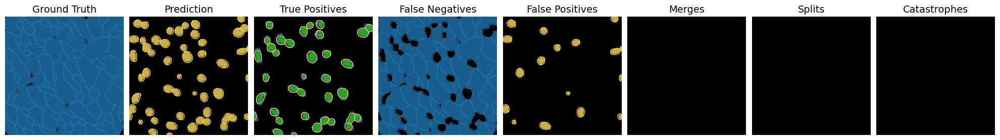

Evaluating mesmer_24h_83_nuclear_crop2...
Precision: 0.44680851063829785
Recall: 0.35
F1: 0.39252336448598135
Splits: 1
Merges: 0
Catastrophes: 1
Mean IoU: 0.6822076831084505
Mean Dice: 0.8076517538020511
True Positives: 21
False Positives: 26
False Negatives: 39
Total GT labels: 60
Total Pred labels: 47
mesmer_24h_83_nuclear_crop2: Precision=0.45, Recall=0.35, F1=0.39, splits=1, merges=0, catastrophes=1, TP=21, FP=26, FN=39


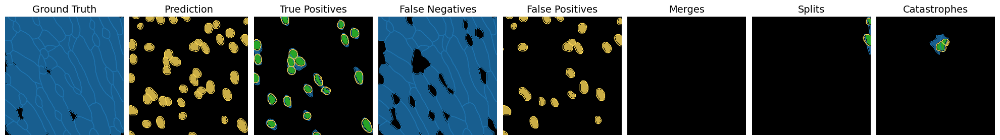

Evaluating mesmer_24h_83_nuclear_crop3...
Precision: 0.46511627906976744
Recall: 0.24096385542168675
F1: 0.31746031746031744
Splits: 0
Merges: 5
Catastrophes: 0
Mean IoU: 0.6567070312200803
Mean Dice: 0.7886806559087736
True Positives: 20
False Positives: 23
False Negatives: 63
Total GT labels: 83
Total Pred labels: 43
mesmer_24h_83_nuclear_crop3: Precision=0.47, Recall=0.24, F1=0.32, splits=0, merges=5, catastrophes=0, TP=20, FP=23, FN=63


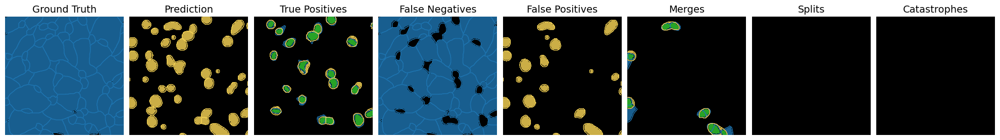

Evaluating mesmer_24h_83_nuclear_crop4...
Precision: 0.3220338983050847
Recall: 0.16964285714285715
F1: 0.2222222222222222
Splits: 1
Merges: 5
Catastrophes: 1
Mean IoU: 0.6556105386183028
Mean Dice: 0.7895224603298073
True Positives: 19
False Positives: 40
False Negatives: 93
Total GT labels: 112
Total Pred labels: 59
mesmer_24h_83_nuclear_crop4: Precision=0.32, Recall=0.17, F1=0.22, splits=1, merges=5, catastrophes=1, TP=19, FP=40, FN=93


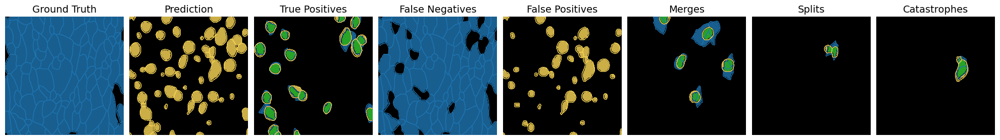

Evaluating mesmer_48h_76_nuclear_crop1...
Precision: 0.4583333333333333
Recall: 0.25287356321839083
F1: 0.3259259259259259
Splits: 2
Merges: 0
Catastrophes: 0
Mean IoU: 0.6880532902156541
Mean Dice: 0.8134340136819938
True Positives: 22
False Positives: 26
False Negatives: 65
Total GT labels: 87
Total Pred labels: 48
mesmer_48h_76_nuclear_crop1: Precision=0.46, Recall=0.25, F1=0.33, splits=2, merges=0, catastrophes=0, TP=22, FP=26, FN=65


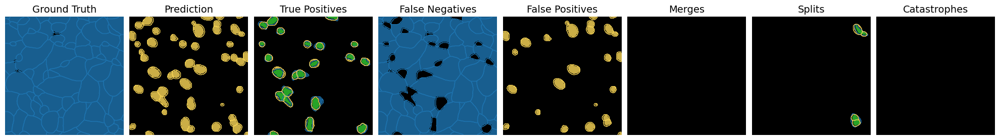

Evaluating mesmer_48h_76_nuclear_crop2...
Precision: 0.28125
Recall: 0.24324324324324326
F1: 0.2608695652173913
Splits: 2
Merges: 0
Catastrophes: 0
Mean IoU: 0.634751654374941
Mean Dice: 0.7738363884763889
True Positives: 9
False Positives: 23
False Negatives: 28
Total GT labels: 37
Total Pred labels: 32
mesmer_48h_76_nuclear_crop2: Precision=0.28, Recall=0.24, F1=0.26, splits=2, merges=0, catastrophes=0, TP=9, FP=23, FN=28


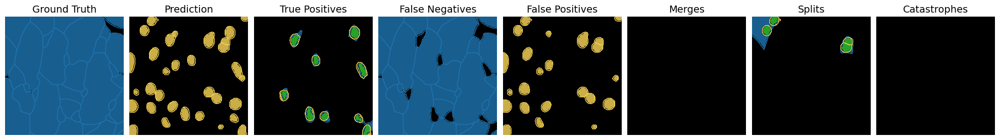

Evaluating mesmer_48h_76_nuclear_crop3...
Precision: 0.5102040816326531
Recall: 0.32051282051282054
F1: 0.39370078740157477
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.6519211557244254
Mean Dice: 0.7859231785811979
True Positives: 25
False Positives: 24
False Negatives: 53
Total GT labels: 78
Total Pred labels: 49
mesmer_48h_76_nuclear_crop3: Precision=0.51, Recall=0.32, F1=0.39, splits=0, merges=0, catastrophes=0, TP=25, FP=24, FN=53


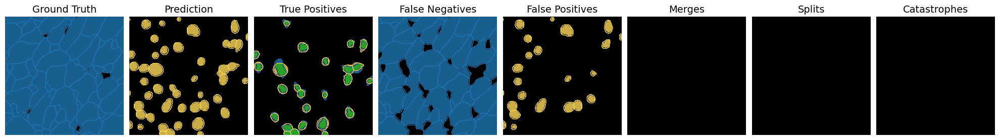

Evaluating mesmer_48h_76_nuclear_crop4...
Precision: 0.3076923076923077
Recall: 0.23529411764705882
F1: 0.26666666666666666
Splits: 1
Merges: 0
Catastrophes: 0
Mean IoU: 0.6404260533660369
Mean Dice: 0.7784532203575768
True Positives: 12
False Positives: 27
False Negatives: 39
Total GT labels: 51
Total Pred labels: 39
mesmer_48h_76_nuclear_crop4: Precision=0.31, Recall=0.24, F1=0.27, splits=1, merges=0, catastrophes=0, TP=12, FP=27, FN=39


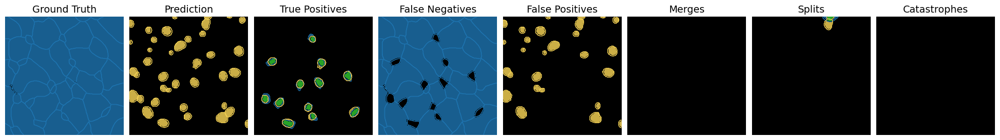

Evaluating mesmer_control_12_nuclear_crop1...
Precision: 0.5272727272727272
Recall: 0.3372093023255814
F1: 0.4113475177304964
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.7160398792111146
Mean Dice: 0.8317030487183039
True Positives: 29
False Positives: 26
False Negatives: 57
Total GT labels: 86
Total Pred labels: 55
mesmer_control_12_nuclear_crop1: Precision=0.53, Recall=0.34, F1=0.41, splits=0, merges=0, catastrophes=0, TP=29, FP=26, FN=57


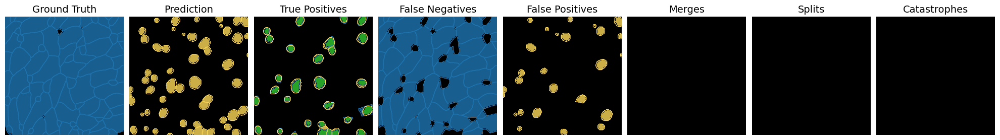

Evaluating mesmer_control_12_nuclear_crop2...
Precision: 0.47058823529411764
Recall: 0.3116883116883117
F1: 0.37499999999999994
Splits: 1
Merges: 1
Catastrophes: 0
Mean IoU: 0.7505335644856158
Mean Dice: 0.8559193531067505
True Positives: 24
False Positives: 27
False Negatives: 53
Total GT labels: 77
Total Pred labels: 51
mesmer_control_12_nuclear_crop2: Precision=0.47, Recall=0.31, F1=0.37, splits=1, merges=1, catastrophes=0, TP=24, FP=27, FN=53


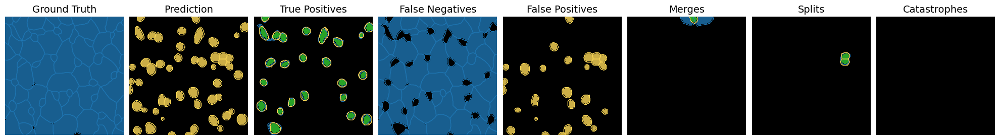

Evaluating mesmer_control_12_nuclear_crop3...
Precision: 0.5714285714285714
Recall: 0.4444444444444444
F1: 0.5
Splits: 1
Merges: 0
Catastrophes: 0
Mean IoU: 0.7057557332520968
Mean Dice: 0.8227667610262662
True Positives: 24
False Positives: 18
False Negatives: 30
Total GT labels: 54
Total Pred labels: 42
mesmer_control_12_nuclear_crop3: Precision=0.57, Recall=0.44, F1=0.50, splits=1, merges=0, catastrophes=0, TP=24, FP=18, FN=30


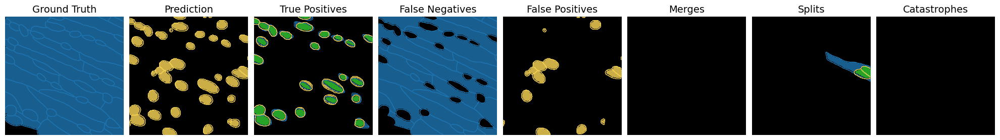

Evaluating mesmer_control_12_nuclear_crop4...
Precision: 0.5510204081632653
Recall: 0.3375
F1: 0.4186046511627907
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.732479847638681
Mean Dice: 0.843610093674692
True Positives: 27
False Positives: 22
False Negatives: 53
Total GT labels: 80
Total Pred labels: 49
mesmer_control_12_nuclear_crop4: Precision=0.55, Recall=0.34, F1=0.42, splits=0, merges=0, catastrophes=0, TP=27, FP=22, FN=53


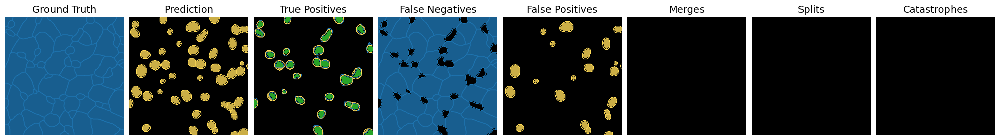

Evaluating mesmer_4h_96_nuclear_crop1...
Precision: 0.42
Recall: 0.25609756097560976
F1: 0.3181818181818182
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.7212713817123286
Mean Dice: 0.8354236516294397
True Positives: 21
False Positives: 29
False Negatives: 61
Total GT labels: 82
Total Pred labels: 50
mesmer_4h_96_nuclear_crop1: Precision=0.42, Recall=0.26, F1=0.32, splits=0, merges=0, catastrophes=0, TP=21, FP=29, FN=61


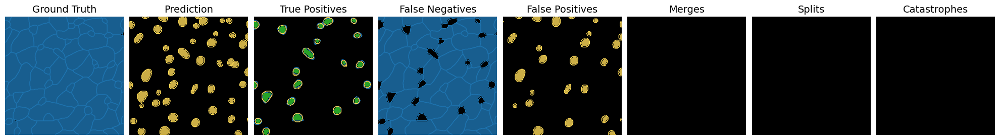

Evaluating mesmer_4h_96_nuclear_crop2...
Precision: 0.5238095238095238
Recall: 0.3235294117647059
F1: 0.4
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.6780307567324373
Mean Dice: 0.8045322033869279
True Positives: 22
False Positives: 20
False Negatives: 46
Total GT labels: 68
Total Pred labels: 42
mesmer_4h_96_nuclear_crop2: Precision=0.52, Recall=0.32, F1=0.40, splits=0, merges=0, catastrophes=0, TP=22, FP=20, FN=46


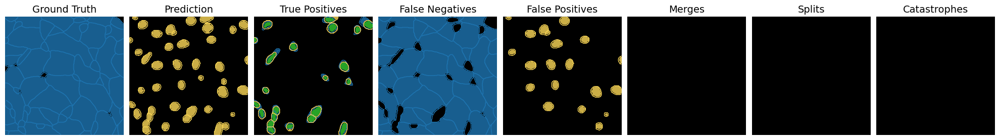

Evaluating mesmer_4h_96_nuclear_crop3...
Precision: 0.4666666666666667
Recall: 0.2727272727272727
F1: 0.34426229508196715
Splits: 0
Merges: 1
Catastrophes: 0
Mean IoU: 0.6434025016776657
Mean Dice: 0.7795809009648612
True Positives: 21
False Positives: 24
False Negatives: 56
Total GT labels: 77
Total Pred labels: 45
mesmer_4h_96_nuclear_crop3: Precision=0.47, Recall=0.27, F1=0.34, splits=0, merges=1, catastrophes=0, TP=21, FP=24, FN=56


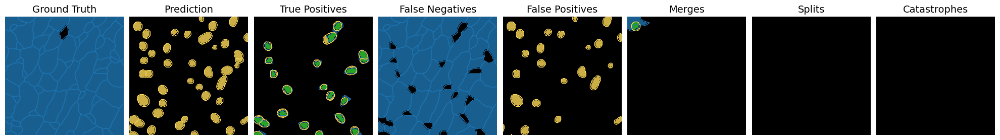

Evaluating mesmer_4h_96_nuclear_crop4...
Precision: 0.42857142857142855
Recall: 0.28378378378378377
F1: 0.3414634146341463
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.652549960910084
Mean Dice: 0.7876857204792787
True Positives: 21
False Positives: 28
False Negatives: 53
Total GT labels: 74
Total Pred labels: 49
mesmer_4h_96_nuclear_crop4: Precision=0.43, Recall=0.28, F1=0.34, splits=0, merges=0, catastrophes=0, TP=21, FP=28, FN=53


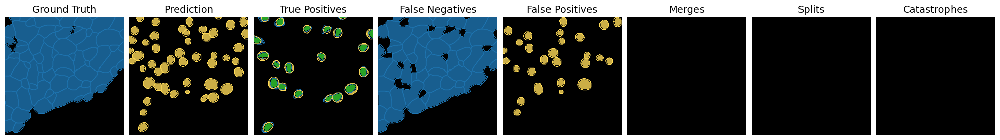

Evaluating mesmer_24h_83_wholecell_crop1...
Precision: 0.6363636363636364
Recall: 0.5490196078431373
F1: 0.5894736842105264
Splits: 3
Merges: 3
Catastrophes: 4
Mean IoU: 0.6918025501279214
Mean Dice: 0.8124906926937785
True Positives: 56
False Positives: 32
False Negatives: 46
Total GT labels: 102
Total Pred labels: 88
mesmer_24h_83_wholecell_crop1: Precision=0.64, Recall=0.55, F1=0.59, splits=3, merges=3, catastrophes=4, TP=56, FP=32, FN=46


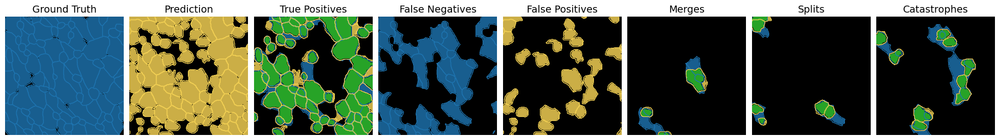

Evaluating mesmer_24h_83_wholecell_crop2...
Precision: 0.5272727272727272
Recall: 0.48333333333333334
F1: 0.5043478260869565
Splits: 2
Merges: 0
Catastrophes: 1
Mean IoU: 0.7220521347004063
Mean Dice: 0.8354973752576513
True Positives: 29
False Positives: 26
False Negatives: 31
Total GT labels: 60
Total Pred labels: 55
mesmer_24h_83_wholecell_crop2: Precision=0.53, Recall=0.48, F1=0.50, splits=2, merges=0, catastrophes=1, TP=29, FP=26, FN=31


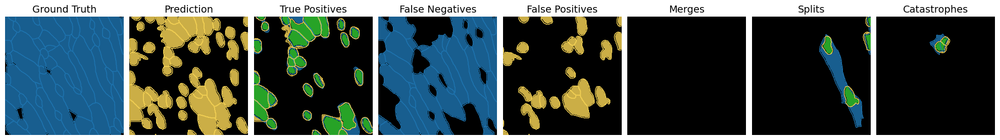

Evaluating mesmer_24h_83_wholecell_crop3...
Precision: 0.5151515151515151
Recall: 0.40963855421686746
F1: 0.45637583892617445
Splits: 0
Merges: 5
Catastrophes: 4
Mean IoU: 0.6935153347454577
Mean Dice: 0.8139664328109202
True Positives: 34
False Positives: 32
False Negatives: 49
Total GT labels: 83
Total Pred labels: 66
mesmer_24h_83_wholecell_crop3: Precision=0.52, Recall=0.41, F1=0.46, splits=0, merges=5, catastrophes=4, TP=34, FP=32, FN=49


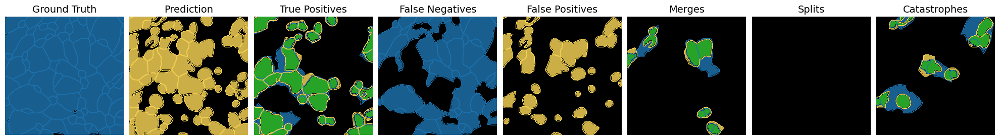

Evaluating mesmer_24h_83_wholecell_crop4...
Precision: 0.225
Recall: 0.16071428571428573
F1: 0.1875
Splits: 1
Merges: 9
Catastrophes: 12
Mean IoU: 0.6078090202848804
Mean Dice: 0.7521085912229406
True Positives: 18
False Positives: 62
False Negatives: 94
Total GT labels: 112
Total Pred labels: 80
mesmer_24h_83_wholecell_crop4: Precision=0.23, Recall=0.16, F1=0.19, splits=1, merges=9, catastrophes=12, TP=18, FP=62, FN=94


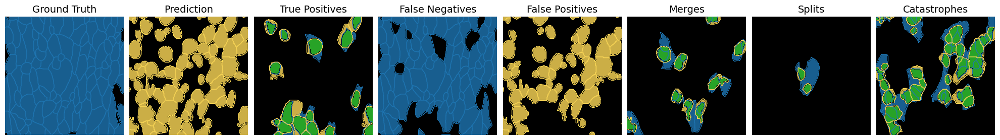

Evaluating mesmer_48h_76_wholecell_crop1...
Precision: 0.5147058823529411
Recall: 0.40229885057471265
F1: 0.45161290322580644
Splits: 1
Merges: 5
Catastrophes: 0
Mean IoU: 0.6840583170921509
Mean Dice: 0.807460026218751
True Positives: 35
False Positives: 33
False Negatives: 52
Total GT labels: 87
Total Pred labels: 68
mesmer_48h_76_wholecell_crop1: Precision=0.51, Recall=0.40, F1=0.45, splits=1, merges=5, catastrophes=0, TP=35, FP=33, FN=52


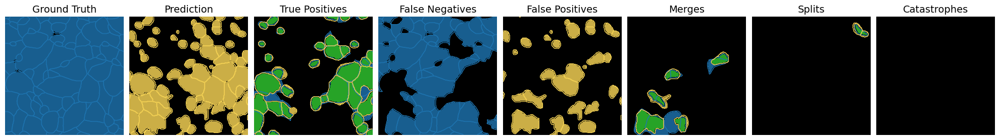

Evaluating mesmer_48h_76_wholecell_crop2...
Precision: 0.2894736842105263
Recall: 0.2972972972972973
F1: 0.29333333333333333
Splits: 1
Merges: 1
Catastrophes: 1
Mean IoU: 0.6647074228544353
Mean Dice: 0.7937435453413625
True Positives: 11
False Positives: 27
False Negatives: 26
Total GT labels: 37
Total Pred labels: 38
mesmer_48h_76_wholecell_crop2: Precision=0.29, Recall=0.30, F1=0.29, splits=1, merges=1, catastrophes=1, TP=11, FP=27, FN=26


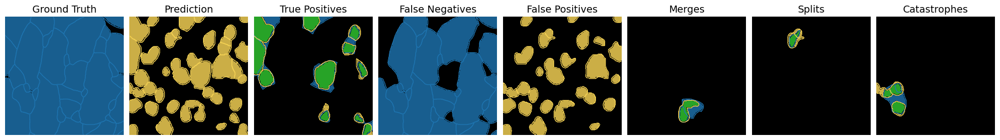

Evaluating mesmer_48h_76_wholecell_crop3...
Precision: 0.5652173913043478
Recall: 0.5
F1: 0.5306122448979592
Splits: 1
Merges: 4
Catastrophes: 2
Mean IoU: 0.6738014472394991
Mean Dice: 0.7988467858280804
True Positives: 39
False Positives: 30
False Negatives: 39
Total GT labels: 78
Total Pred labels: 69
mesmer_48h_76_wholecell_crop3: Precision=0.57, Recall=0.50, F1=0.53, splits=1, merges=4, catastrophes=2, TP=39, FP=30, FN=39


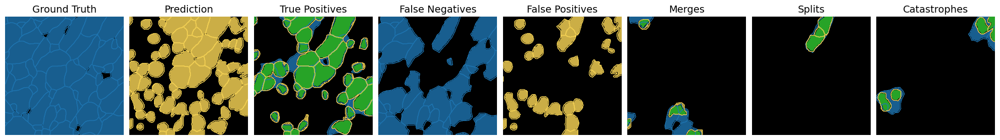

Evaluating mesmer_48h_76_wholecell_crop4...
Precision: 0.3333333333333333
Recall: 0.37254901960784315
F1: 0.35185185185185186
Splits: 7
Merges: 3
Catastrophes: 3
Mean IoU: 0.6674789755288275
Mean Dice: 0.7948815403912978
True Positives: 19
False Positives: 38
False Negatives: 32
Total GT labels: 51
Total Pred labels: 57
mesmer_48h_76_wholecell_crop4: Precision=0.33, Recall=0.37, F1=0.35, splits=7, merges=3, catastrophes=3, TP=19, FP=38, FN=32


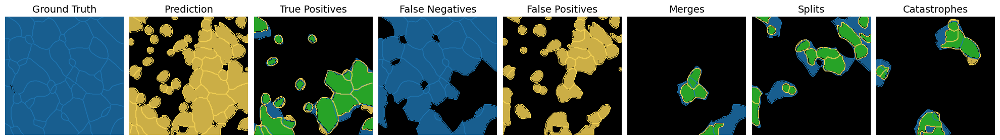

Evaluating mesmer_control_12_wholecell_crop1...
Precision: 0.6329113924050633
Recall: 0.5813953488372093
F1: 0.6060606060606061
Splits: 2
Merges: 2
Catastrophes: 0
Mean IoU: 0.6869233555805471
Mean Dice: 0.8081453519063497
True Positives: 50
False Positives: 29
False Negatives: 36
Total GT labels: 86
Total Pred labels: 79
mesmer_control_12_wholecell_crop1: Precision=0.63, Recall=0.58, F1=0.61, splits=2, merges=2, catastrophes=0, TP=50, FP=29, FN=36


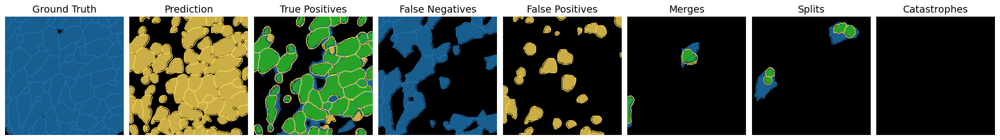

Evaluating mesmer_control_12_wholecell_crop2...
Precision: 0.6626506024096386
Recall: 0.7142857142857143
F1: 0.6875
Splits: 2
Merges: 0
Catastrophes: 0
Mean IoU: 0.7068582636737127
Mean Dice: 0.8222961921545936
True Positives: 55
False Positives: 28
False Negatives: 22
Total GT labels: 77
Total Pred labels: 83
mesmer_control_12_wholecell_crop2: Precision=0.66, Recall=0.71, F1=0.69, splits=2, merges=0, catastrophes=0, TP=55, FP=28, FN=22


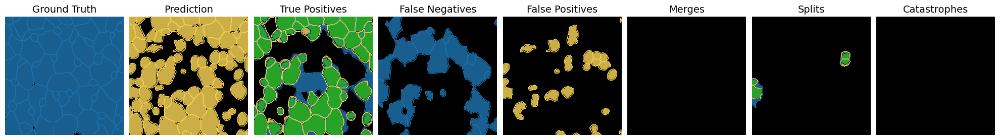

Evaluating mesmer_control_12_wholecell_crop3...
Precision: 0.5853658536585366
Recall: 0.4444444444444444
F1: 0.5052631578947369
Splits: 1
Merges: 1
Catastrophes: 0
Mean IoU: 0.7199976767315973
Mean Dice: 0.8331082485852538
True Positives: 24
False Positives: 17
False Negatives: 30
Total GT labels: 54
Total Pred labels: 41
mesmer_control_12_wholecell_crop3: Precision=0.59, Recall=0.44, F1=0.51, splits=1, merges=1, catastrophes=0, TP=24, FP=17, FN=30


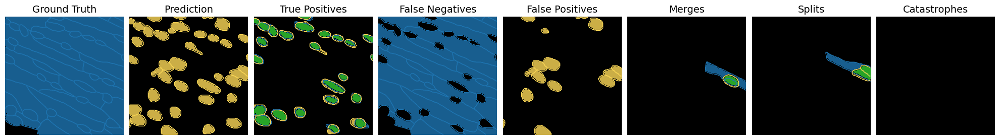

Evaluating mesmer_control_12_wholecell_crop4...
Precision: 0.5443037974683544
Recall: 0.5375
F1: 0.5408805031446541
Splits: 2
Merges: 1
Catastrophes: 5
Mean IoU: 0.7196010162999276
Mean Dice: 0.8304891260269773
True Positives: 43
False Positives: 36
False Negatives: 37
Total GT labels: 80
Total Pred labels: 79
mesmer_control_12_wholecell_crop4: Precision=0.54, Recall=0.54, F1=0.54, splits=2, merges=1, catastrophes=5, TP=43, FP=36, FN=37


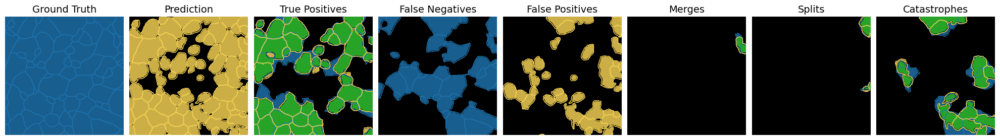

Evaluating mesmer_4h_96_wholecell_crop1...
Precision: 0.5263157894736842
Recall: 0.4878048780487805
F1: 0.5063291139240506
Splits: 1
Merges: 2
Catastrophes: 3
Mean IoU: 0.7128162577570616
Mean Dice: 0.8280101883816691
True Positives: 40
False Positives: 36
False Negatives: 42
Total GT labels: 82
Total Pred labels: 76
mesmer_4h_96_wholecell_crop1: Precision=0.53, Recall=0.49, F1=0.51, splits=1, merges=2, catastrophes=3, TP=40, FP=36, FN=42


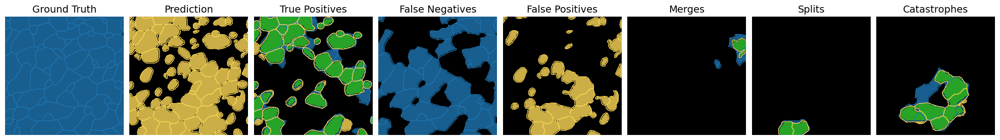

Evaluating mesmer_4h_96_wholecell_crop2...
Precision: 0.6417910447761194
Recall: 0.6323529411764706
F1: 0.637037037037037
Splits: 2
Merges: 1
Catastrophes: 0
Mean IoU: 0.7044008091149714
Mean Dice: 0.8207396349348778
True Positives: 43
False Positives: 24
False Negatives: 25
Total GT labels: 68
Total Pred labels: 67
mesmer_4h_96_wholecell_crop2: Precision=0.64, Recall=0.63, F1=0.64, splits=2, merges=1, catastrophes=0, TP=43, FP=24, FN=25


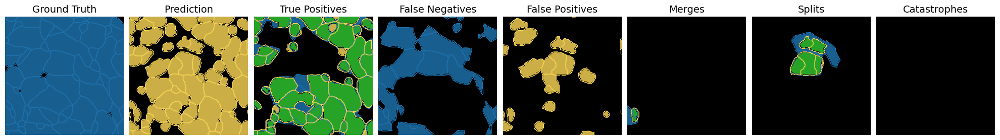

Evaluating mesmer_4h_96_wholecell_crop3...
Precision: 0.547945205479452
Recall: 0.5194805194805194
F1: 0.5333333333333332
Splits: 3
Merges: 9
Catastrophes: 1
Mean IoU: 0.7248178347828342
Mean Dice: 0.8341655933217507
True Positives: 40
False Positives: 33
False Negatives: 37
Total GT labels: 77
Total Pred labels: 73
mesmer_4h_96_wholecell_crop3: Precision=0.55, Recall=0.52, F1=0.53, splits=3, merges=9, catastrophes=1, TP=40, FP=33, FN=37


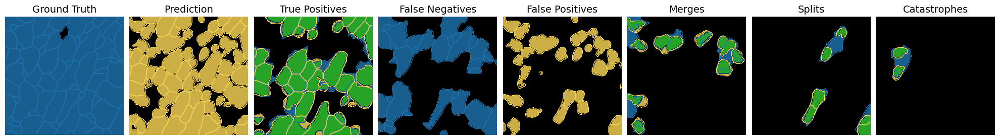

Evaluating mesmer_4h_96_wholecell_crop4...
Precision: 0.49206349206349204
Recall: 0.4189189189189189
F1: 0.4525547445255474
Splits: 2
Merges: 3
Catastrophes: 2
Mean IoU: 0.6909329516135536
Mean Dice: 0.8129757020794373
True Positives: 31
False Positives: 32
False Negatives: 43
Total GT labels: 74
Total Pred labels: 63
mesmer_4h_96_wholecell_crop4: Precision=0.49, Recall=0.42, F1=0.45, splits=2, merges=3, catastrophes=2, TP=31, FP=32, FN=43


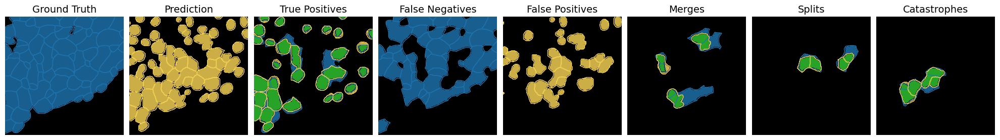

Evaluating cellpose_24h_83_cyto_crop1...
Precision: 0.7735849056603774
Recall: 0.4019607843137255
F1: 0.5290322580645161
Splits: 0
Merges: 1
Catastrophes: 0
Mean IoU: 0.7840916479474805
Mean Dice: 0.8766724734134801
True Positives: 41
False Positives: 12
False Negatives: 61
Total GT labels: 102
Total Pred labels: 53
cellpose_24h_83_cyto_crop1: Precision=0.77, Recall=0.40, F1=0.53, splits=0, merges=1, catastrophes=0, TP=41, FP=12, FN=61


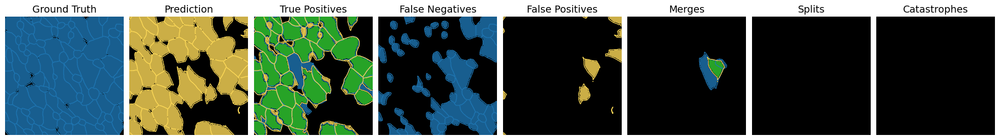

Evaluating cellpose_24h_83_cyto_crop2...
Precision: 0.125
Recall: 0.08333333333333333
F1: 0.1
Splits: 0
Merges: 4
Catastrophes: 3
Mean IoU: 0.6076755409492376
Mean Dice: 0.7527543217994903
True Positives: 5
False Positives: 35
False Negatives: 55
Total GT labels: 60
Total Pred labels: 40
cellpose_24h_83_cyto_crop2: Precision=0.12, Recall=0.08, F1=0.10, splits=0, merges=4, catastrophes=3, TP=5, FP=35, FN=55


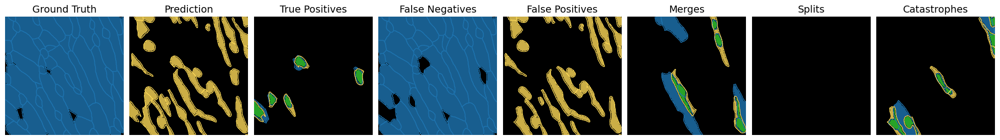

Evaluating cellpose_24h_83_cyto_crop3...
Precision: 0.6551724137931034
Recall: 0.2289156626506024
F1: 0.3392857142857143
Splits: 0
Merges: 4
Catastrophes: 0
Mean IoU: 0.7602723489634344
Mean Dice: 0.8616231203934409
True Positives: 19
False Positives: 10
False Negatives: 64
Total GT labels: 83
Total Pred labels: 29
cellpose_24h_83_cyto_crop3: Precision=0.66, Recall=0.23, F1=0.34, splits=0, merges=4, catastrophes=0, TP=19, FP=10, FN=64


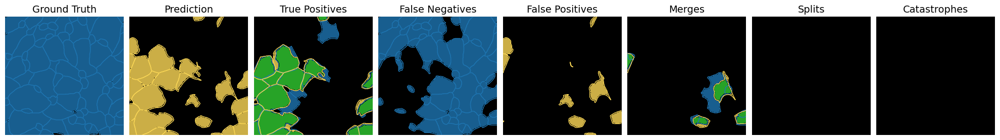

Evaluating cellpose_24h_83_cyto_crop4...
Precision: 0.6
Recall: 0.21428571428571427
F1: 0.3157894736842105
Splits: 2
Merges: 3
Catastrophes: 1
Mean IoU: 0.650152986465419
Mean Dice: 0.7841480588058558
True Positives: 24
False Positives: 16
False Negatives: 88
Total GT labels: 112
Total Pred labels: 40
cellpose_24h_83_cyto_crop4: Precision=0.60, Recall=0.21, F1=0.32, splits=2, merges=3, catastrophes=1, TP=24, FP=16, FN=88


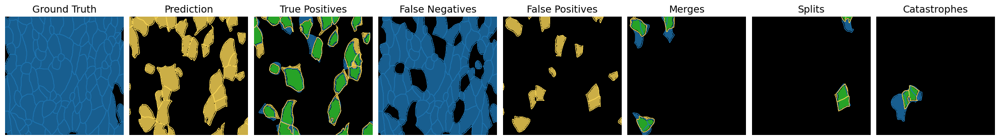

Evaluating cellpose_48h_76_cyto_crop1...
Precision: 0.8032786885245902
Recall: 0.5632183908045977
F1: 0.6621621621621622
Splits: 0
Merges: 4
Catastrophes: 0
Mean IoU: 0.7624540902314318
Mean Dice: 0.8603691773056278
True Positives: 49
False Positives: 12
False Negatives: 38
Total GT labels: 87
Total Pred labels: 61
cellpose_48h_76_cyto_crop1: Precision=0.80, Recall=0.56, F1=0.66, splits=0, merges=4, catastrophes=0, TP=49, FP=12, FN=38


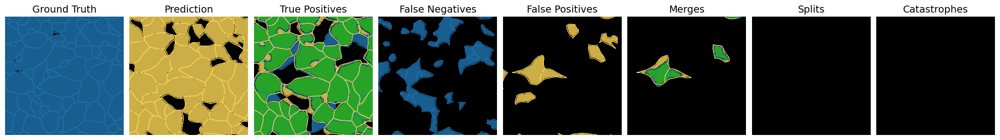

Evaluating cellpose_48h_76_cyto_crop2...
Precision: 0.17647058823529413
Recall: 0.16216216216216217
F1: 0.16901408450704228
Splits: 0
Merges: 2
Catastrophes: 0
Mean IoU: 0.6333270329123026
Mean Dice: 0.7745211829294059
True Positives: 6
False Positives: 28
False Negatives: 31
Total GT labels: 37
Total Pred labels: 34
cellpose_48h_76_cyto_crop2: Precision=0.18, Recall=0.16, F1=0.17, splits=0, merges=2, catastrophes=0, TP=6, FP=28, FN=31


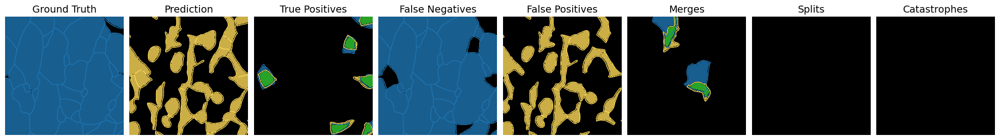

Evaluating cellpose_48h_76_cyto_crop3...
Precision: 0.86
Recall: 0.5512820512820513
F1: 0.671875
Splits: 0
Merges: 2
Catastrophes: 0
Mean IoU: 0.8276968141085288
Mean Dice: 0.9001047632827
True Positives: 43
False Positives: 7
False Negatives: 35
Total GT labels: 78
Total Pred labels: 50
cellpose_48h_76_cyto_crop3: Precision=0.86, Recall=0.55, F1=0.67, splits=0, merges=2, catastrophes=0, TP=43, FP=7, FN=35


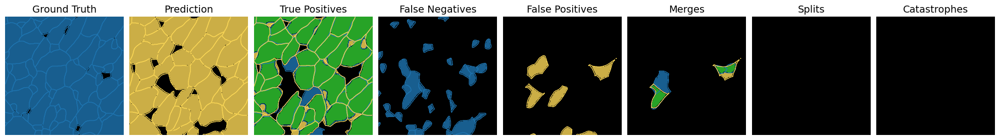

Evaluating cellpose_48h_76_cyto_crop4...
Precision: 0.71875
Recall: 0.45098039215686275
F1: 0.5542168674698795
Splits: 0
Merges: 1
Catastrophes: 0
Mean IoU: 0.7959192261206581
Mean Dice: 0.8819270732813208
True Positives: 23
False Positives: 9
False Negatives: 28
Total GT labels: 51
Total Pred labels: 32
cellpose_48h_76_cyto_crop4: Precision=0.72, Recall=0.45, F1=0.55, splits=0, merges=1, catastrophes=0, TP=23, FP=9, FN=28


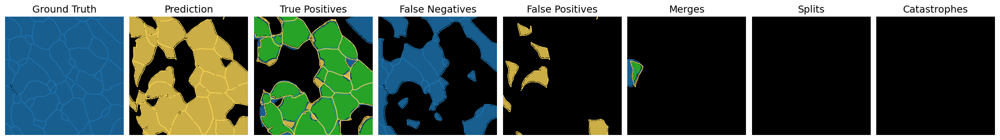

Evaluating cellpose_control_12_cyto_crop1...
Precision: 0.9152542372881356
Recall: 0.627906976744186
F1: 0.7448275862068966
Splits: 0
Merges: 1
Catastrophes: 0
Mean IoU: 0.8397988302681418
Mean Dice: 0.9101844399347565
True Positives: 54
False Positives: 5
False Negatives: 32
Total GT labels: 86
Total Pred labels: 59
cellpose_control_12_cyto_crop1: Precision=0.92, Recall=0.63, F1=0.74, splits=0, merges=1, catastrophes=0, TP=54, FP=5, FN=32


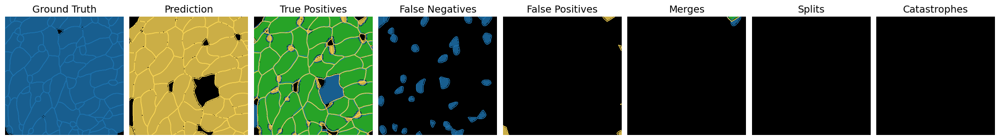

Evaluating cellpose_control_12_cyto_crop2...
Precision: 0.9615384615384616
Recall: 0.6493506493506493
F1: 0.7751937984496123
Splits: 0
Merges: 1
Catastrophes: 0
Mean IoU: 0.849930651294153
Mean Dice: 0.9162820335599683
True Positives: 50
False Positives: 2
False Negatives: 27
Total GT labels: 77
Total Pred labels: 52
cellpose_control_12_cyto_crop2: Precision=0.96, Recall=0.65, F1=0.78, splits=0, merges=1, catastrophes=0, TP=50, FP=2, FN=27


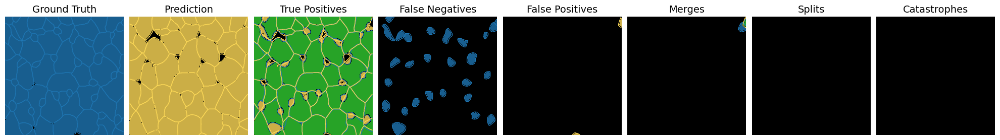

Evaluating cellpose_control_12_cyto_crop3...
Precision: 0.34615384615384615
Recall: 0.16666666666666666
F1: 0.22499999999999998
Splits: 0
Merges: 4
Catastrophes: 0
Mean IoU: 0.5867008207234976
Mean Dice: 0.7378682043087186
True Positives: 9
False Positives: 17
False Negatives: 45
Total GT labels: 54
Total Pred labels: 26
cellpose_control_12_cyto_crop3: Precision=0.35, Recall=0.17, F1=0.22, splits=0, merges=4, catastrophes=0, TP=9, FP=17, FN=45


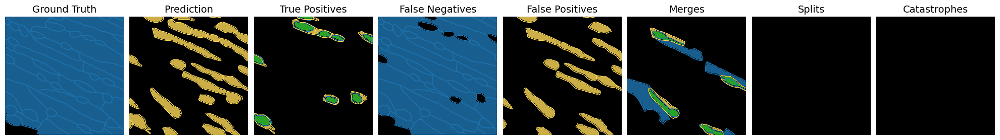

Evaluating cellpose_control_12_cyto_crop4...
Precision: 0.8305084745762712
Recall: 0.6125
F1: 0.7050359712230216
Splits: 1
Merges: 0
Catastrophes: 0
Mean IoU: 0.8336116148436067
Mean Dice: 0.9052154147320319
True Positives: 49
False Positives: 10
False Negatives: 31
Total GT labels: 80
Total Pred labels: 59
cellpose_control_12_cyto_crop4: Precision=0.83, Recall=0.61, F1=0.71, splits=1, merges=0, catastrophes=0, TP=49, FP=10, FN=31


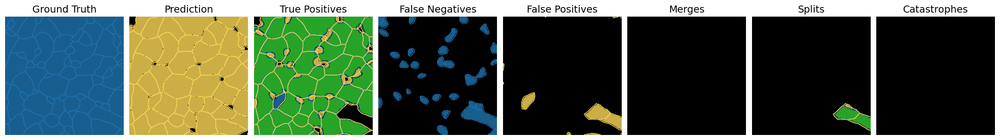

Evaluating cellpose_4h_96_cyto_crop1...
Precision: 0.8461538461538461
Recall: 0.5365853658536586
F1: 0.6567164179104478
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8208871909863494
Mean Dice: 0.8970194617153364
True Positives: 44
False Positives: 8
False Negatives: 38
Total GT labels: 82
Total Pred labels: 52
cellpose_4h_96_cyto_crop1: Precision=0.85, Recall=0.54, F1=0.66, splits=0, merges=0, catastrophes=0, TP=44, FP=8, FN=38


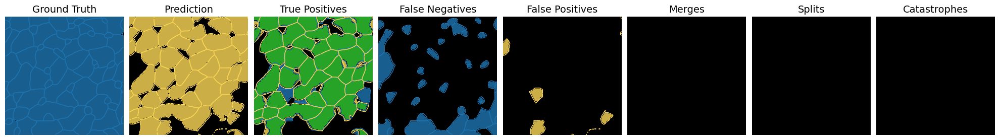

Evaluating cellpose_4h_96_cyto_crop2...
Precision: 0.8285714285714286
Recall: 0.4264705882352941
F1: 0.5631067961165048
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.7908360690808085
Mean Dice: 0.8783741392279422
True Positives: 29
False Positives: 6
False Negatives: 39
Total GT labels: 68
Total Pred labels: 35
cellpose_4h_96_cyto_crop2: Precision=0.83, Recall=0.43, F1=0.56, splits=0, merges=0, catastrophes=0, TP=29, FP=6, FN=39


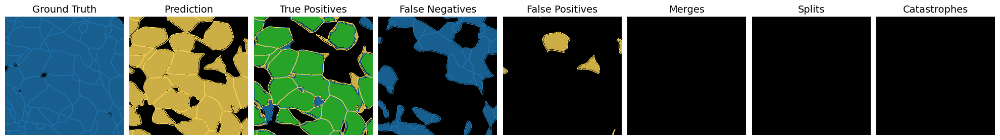

Evaluating cellpose_4h_96_cyto_crop3...
Precision: 0.8723404255319149
Recall: 0.5324675324675324
F1: 0.6612903225806451
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8335865373009455
Mean Dice: 0.9068565131034921
True Positives: 41
False Positives: 6
False Negatives: 36
Total GT labels: 77
Total Pred labels: 47
cellpose_4h_96_cyto_crop3: Precision=0.87, Recall=0.53, F1=0.66, splits=0, merges=0, catastrophes=0, TP=41, FP=6, FN=36


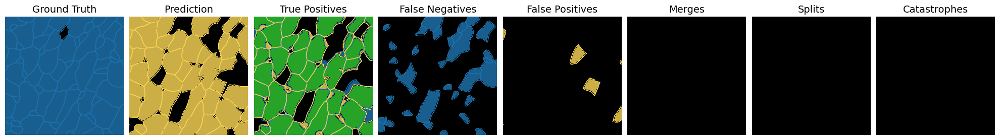

Evaluating cellpose_4h_96_cyto_crop4...
Precision: 0.7608695652173914
Recall: 0.47297297297297297
F1: 0.5833333333333333
Splits: 0
Merges: 1
Catastrophes: 1
Mean IoU: 0.7831976416778751
Mean Dice: 0.8738991050173045
True Positives: 35
False Positives: 11
False Negatives: 39
Total GT labels: 74
Total Pred labels: 46
cellpose_4h_96_cyto_crop4: Precision=0.76, Recall=0.47, F1=0.58, splits=0, merges=1, catastrophes=1, TP=35, FP=11, FN=39


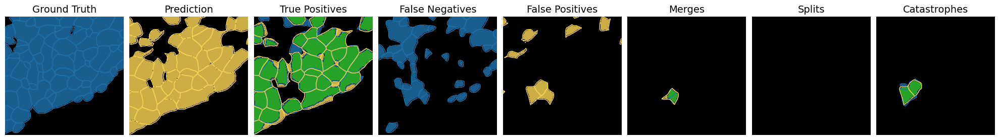

Evaluating cellpose_24h_83_custom_crop1...
Precision: 0.8648648648648649
Recall: 0.9411764705882353
F1: 0.9014084507042254
Splits: 1
Merges: 0
Catastrophes: 0
Mean IoU: 0.8412622530236739
Mean Dice: 0.9119389100612268
True Positives: 96
False Positives: 15
False Negatives: 6
Total GT labels: 102
Total Pred labels: 111
cellpose_24h_83_custom_crop1: Precision=0.86, Recall=0.94, F1=0.90, splits=1, merges=0, catastrophes=0, TP=96, FP=15, FN=6


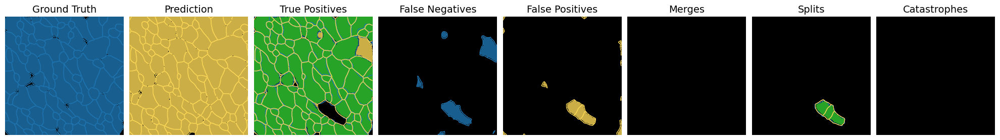

Evaluating cellpose_24h_83_custom_crop2...
Precision: 0.8181818181818182
Recall: 0.9
F1: 0.8571428571428572
Splits: 1
Merges: 0
Catastrophes: 0
Mean IoU: 0.8234146333850838
Mean Dice: 0.9008983224480459
True Positives: 54
False Positives: 12
False Negatives: 6
Total GT labels: 60
Total Pred labels: 66
cellpose_24h_83_custom_crop2: Precision=0.82, Recall=0.90, F1=0.86, splits=1, merges=0, catastrophes=0, TP=54, FP=12, FN=6


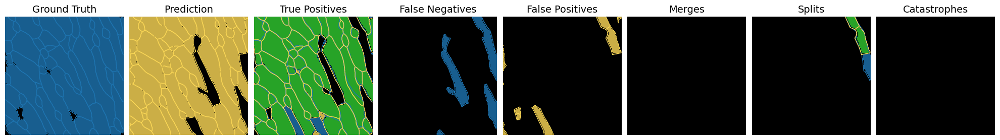

Evaluating cellpose_24h_83_custom_crop3...
Precision: 0.9101123595505618
Recall: 0.9759036144578314
F1: 0.9418604651162792
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.7958162333799809
Mean Dice: 0.8825900784296851
True Positives: 81
False Positives: 8
False Negatives: 2
Total GT labels: 83
Total Pred labels: 89
cellpose_24h_83_custom_crop3: Precision=0.91, Recall=0.98, F1=0.94, splits=0, merges=0, catastrophes=0, TP=81, FP=8, FN=2


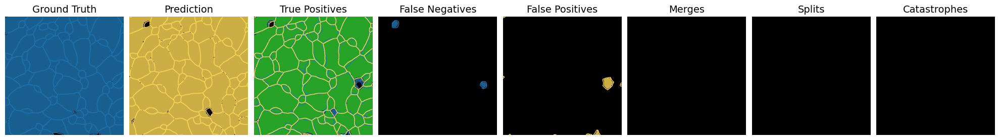

Evaluating cellpose_24h_83_custom_crop4...
Precision: 0.8378378378378378
Recall: 0.8303571428571429
F1: 0.8340807174887892
Splits: 1
Merges: 0
Catastrophes: 2
Mean IoU: 0.75629499137957
Mean Dice: 0.8576477614534561
True Positives: 93
False Positives: 18
False Negatives: 19
Total GT labels: 112
Total Pred labels: 111
cellpose_24h_83_custom_crop4: Precision=0.84, Recall=0.83, F1=0.83, splits=1, merges=0, catastrophes=2, TP=93, FP=18, FN=19


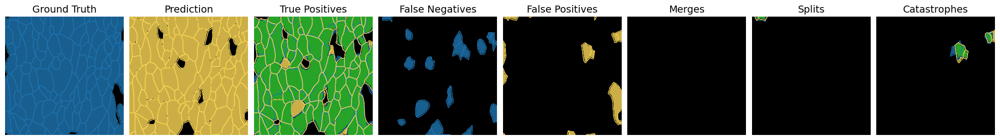

Evaluating cellpose_48h_76_custom_crop1...
Precision: 0.9135802469135802
Recall: 0.8505747126436781
F1: 0.880952380952381
Splits: 1
Merges: 2
Catastrophes: 0
Mean IoU: 0.8044477461473402
Mean Dice: 0.8877319399080432
True Positives: 74
False Positives: 7
False Negatives: 13
Total GT labels: 87
Total Pred labels: 81
cellpose_48h_76_custom_crop1: Precision=0.91, Recall=0.85, F1=0.88, splits=1, merges=2, catastrophes=0, TP=74, FP=7, FN=13


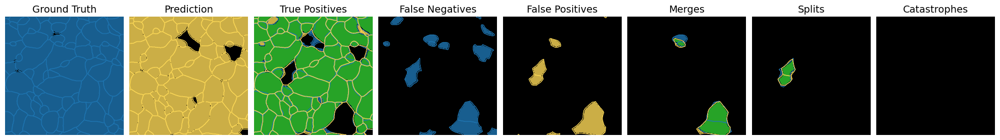

Evaluating cellpose_48h_76_custom_crop2...
Precision: 0.9487179487179487
Recall: 1.0
F1: 0.9736842105263156
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8342531418071562
Mean Dice: 0.9062842503124828
True Positives: 37
False Positives: 2
False Negatives: 0
Total GT labels: 37
Total Pred labels: 39
cellpose_48h_76_custom_crop2: Precision=0.95, Recall=1.00, F1=0.97, splits=0, merges=0, catastrophes=0, TP=37, FP=2, FN=0


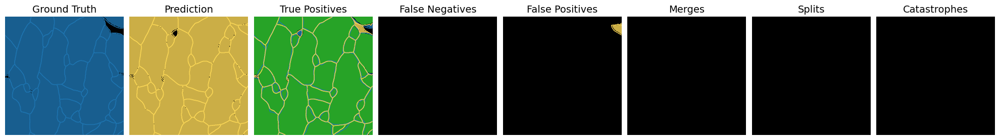

Evaluating cellpose_48h_76_custom_crop3...
Precision: 0.9746835443037974
Recall: 0.9871794871794872
F1: 0.9808917197452229
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8375728734130926
Mean Dice: 0.9086841933799812
True Positives: 77
False Positives: 2
False Negatives: 1
Total GT labels: 78
Total Pred labels: 79
cellpose_48h_76_custom_crop3: Precision=0.97, Recall=0.99, F1=0.98, splits=0, merges=0, catastrophes=0, TP=77, FP=2, FN=1


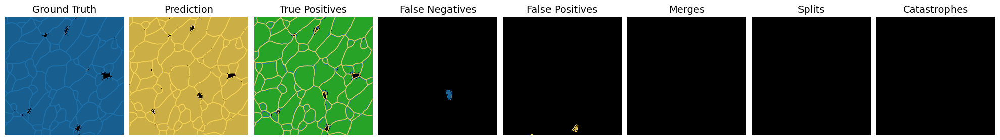

Evaluating cellpose_48h_76_custom_crop4...
Precision: 0.9423076923076923
Recall: 0.9607843137254902
F1: 0.9514563106796117
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.847332600459075
Mean Dice: 0.9129358327075626
True Positives: 49
False Positives: 3
False Negatives: 2
Total GT labels: 51
Total Pred labels: 52
cellpose_48h_76_custom_crop4: Precision=0.94, Recall=0.96, F1=0.95, splits=0, merges=0, catastrophes=0, TP=49, FP=3, FN=2


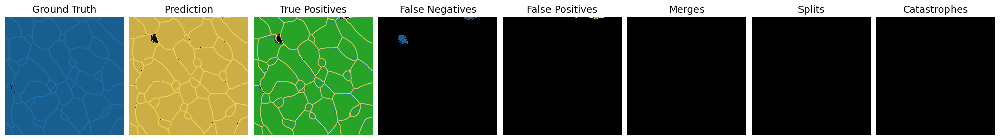

Evaluating cellpose_control_12_custom_crop1...
Precision: 0.9204545454545454
Recall: 0.9418604651162791
F1: 0.9310344827586208
Splits: 0
Merges: 1
Catastrophes: 0
Mean IoU: 0.8563935842789848
Mean Dice: 0.9208948127023745
True Positives: 81
False Positives: 7
False Negatives: 5
Total GT labels: 86
Total Pred labels: 88
cellpose_control_12_custom_crop1: Precision=0.92, Recall=0.94, F1=0.93, splits=0, merges=1, catastrophes=0, TP=81, FP=7, FN=5


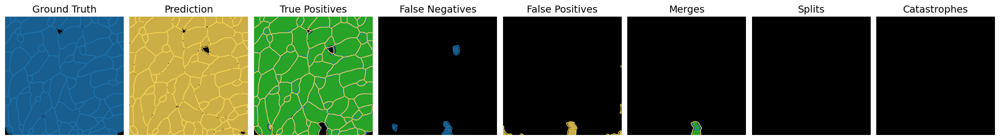

Evaluating cellpose_control_12_custom_crop2...
Precision: 0.9493670886075949
Recall: 0.974025974025974
F1: 0.9615384615384615
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.850572048608438
Mean Dice: 0.9165231296334975
True Positives: 75
False Positives: 4
False Negatives: 2
Total GT labels: 77
Total Pred labels: 79
cellpose_control_12_custom_crop2: Precision=0.95, Recall=0.97, F1=0.96, splits=0, merges=0, catastrophes=0, TP=75, FP=4, FN=2


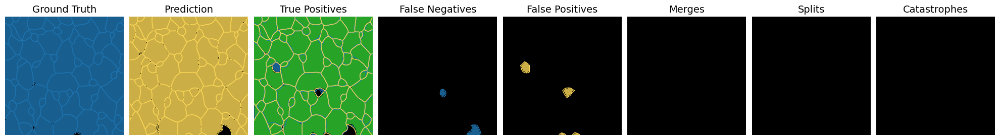

Evaluating cellpose_control_12_custom_crop3...
Precision: 0.7857142857142857
Recall: 0.8148148148148148
F1: 0.8
Splits: 1
Merges: 0
Catastrophes: 0
Mean IoU: 0.7447866988675643
Mean Dice: 0.8486402767489989
True Positives: 44
False Positives: 12
False Negatives: 10
Total GT labels: 54
Total Pred labels: 56
cellpose_control_12_custom_crop3: Precision=0.79, Recall=0.81, F1=0.80, splits=1, merges=0, catastrophes=0, TP=44, FP=12, FN=10


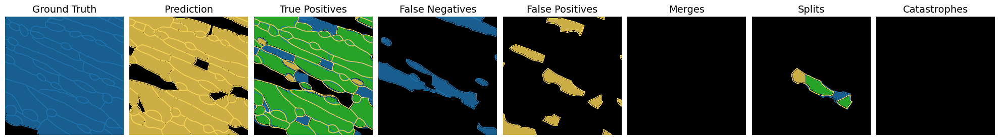

Evaluating cellpose_control_12_custom_crop4...
Precision: 0.9176470588235294
Recall: 0.975
F1: 0.9454545454545452
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8408882087928157
Mean Dice: 0.910057854465119
True Positives: 78
False Positives: 7
False Negatives: 2
Total GT labels: 80
Total Pred labels: 85
cellpose_control_12_custom_crop4: Precision=0.92, Recall=0.97, F1=0.95, splits=0, merges=0, catastrophes=0, TP=78, FP=7, FN=2


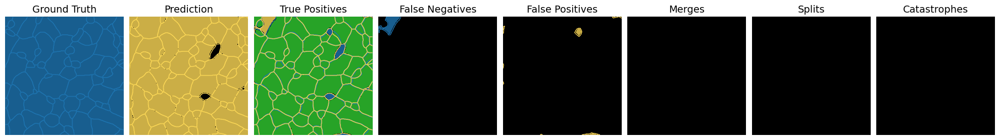

Evaluating cellpose_4h_96_custom_crop1...
Precision: 0.95
Recall: 0.926829268292683
F1: 0.9382716049382716
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8586990850342187
Mean Dice: 0.922243537462021
True Positives: 76
False Positives: 4
False Negatives: 6
Total GT labels: 82
Total Pred labels: 80
cellpose_4h_96_custom_crop1: Precision=0.95, Recall=0.93, F1=0.94, splits=0, merges=0, catastrophes=0, TP=76, FP=4, FN=6


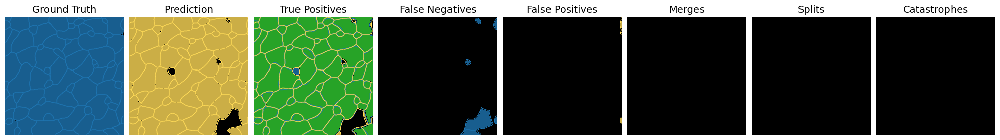

Evaluating cellpose_4h_96_custom_crop2...
Precision: 0.9295774647887324
Recall: 0.9705882352941176
F1: 0.9496402877697843
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8279439109714415
Mean Dice: 0.9022311992337837
True Positives: 66
False Positives: 5
False Negatives: 2
Total GT labels: 68
Total Pred labels: 71
cellpose_4h_96_custom_crop2: Precision=0.93, Recall=0.97, F1=0.95, splits=0, merges=0, catastrophes=0, TP=66, FP=5, FN=2


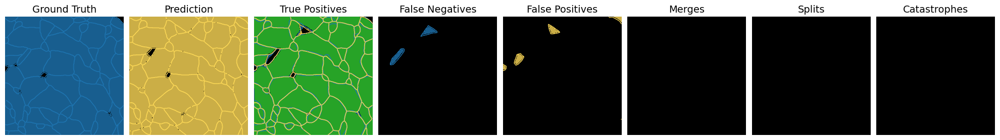

Evaluating cellpose_4h_96_custom_crop3...
Precision: 0.8780487804878049
Recall: 0.935064935064935
F1: 0.9056603773584907
Splits: 1
Merges: 1
Catastrophes: 0
Mean IoU: 0.8297879254441599
Mean Dice: 0.9019862205641823
True Positives: 72
False Positives: 10
False Negatives: 5
Total GT labels: 77
Total Pred labels: 82
cellpose_4h_96_custom_crop3: Precision=0.88, Recall=0.94, F1=0.91, splits=1, merges=1, catastrophes=0, TP=72, FP=10, FN=5


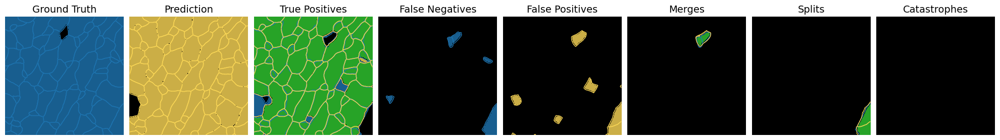

Evaluating cellpose_4h_96_custom_crop4...
Precision: 0.8987341772151899
Recall: 0.9594594594594594
F1: 0.9281045751633986
Splits: 0
Merges: 0
Catastrophes: 0
Mean IoU: 0.8043881121695418
Mean Dice: 0.8880515873754875
True Positives: 71
False Positives: 8
False Negatives: 3
Total GT labels: 74
Total Pred labels: 79
cellpose_4h_96_custom_crop4: Precision=0.90, Recall=0.96, F1=0.93, splits=0, merges=0, catastrophes=0, TP=71, FP=8, FN=3


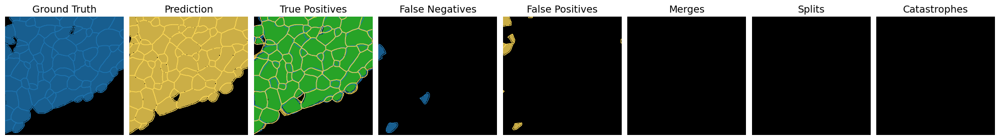

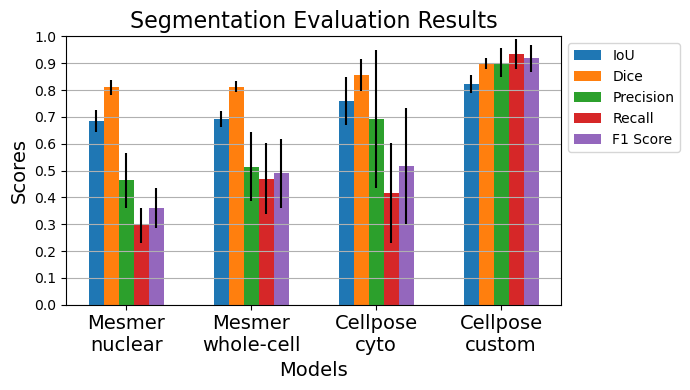

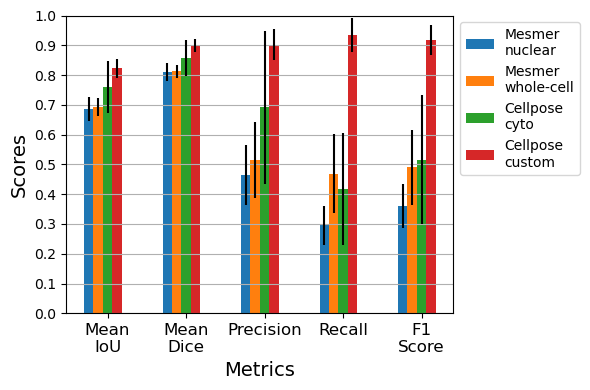

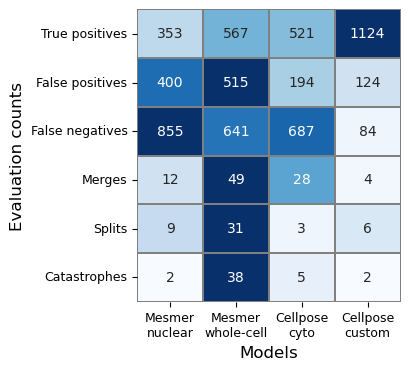

In [97]:
total_iou_list = []
total_dice_list = []
for row in range(0, 64):#crop_df.index:
    print(f"Evaluating {crop_df.id[row]}...")

    # Load ground truth and predicted masks
    gt_mask = tifffile.imread(crop_df.GT[row])
    pred_mask = tifffile.imread(crop_df.segmentation[row])

    metrics = evaluate_segmentation_metrics(gt_mask, pred_mask, iou_threshold=0.4, graph_iou_threshold=0.1, unmatched_cost=0.5)

    for key in metrics.keys():
        if key not in crop_df.columns:
            crop_df[key] = None
    
    crop_df.at[row, "iou_mean"] = metrics["iou_mean"]
    crop_df.at[row, "dice_mean"] = metrics["dice_mean"]
    crop_df.at[row, "precision"] = metrics["precision"]
    crop_df.at[row, "recall"] = metrics["recall"]
    crop_df.at[row, "f1_score"] = metrics["f1_score"]
    crop_df.at[row, "splits"] = metrics["splits"]
    crop_df.at[row, "merges"] = metrics["merges"]
    crop_df.at[row, "catastrophes"] = metrics["catastrophes"]
    crop_df.at[row, "true_positives"] = metrics["true_positives"]
    crop_df.at[row, "false_positives"] = metrics["false_positives"]
    crop_df.at[row, "false_negatives"] = metrics["false_negatives"]
    crop_df.at[row, "n_gt_labels"] = metrics["n_gt_labels"]
    crop_df.at[row, "n_pred_labels"] = metrics["n_pred_labels"]
    total_iou_list += metrics["iou_list"]
    total_dice_list += metrics["dice_list"]

    print("Precision:", metrics["precision"])
    print("Recall:", metrics["recall"])
    print("F1:", metrics["f1_score"])
    print("Splits:", metrics["splits"])
    print("Merges:", metrics["merges"])
    print("Catastrophes:", metrics["catastrophes"])
    print("Mean IoU:", metrics["iou_mean"])
    print("Mean Dice:", metrics["dice_mean"])
    print("True Positives:", metrics["true_positives"])
    print("False Positives:", metrics["false_positives"])
    print("False Negatives:", metrics["false_negatives"])
    print("Total GT labels:", metrics["n_gt_labels"])
    print("Total Pred labels:", metrics["n_pred_labels"])

    plot_error_types(gt_mask, pred_mask, metrics, name=crop_df.id[row], save=False)

model_metrics = get_model_metrics(crop_df)
plot_segmentation_evaluation(model_metrics, save=False, out_path='/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/final_segmentation_evaluation_per_method.png')
plot_segmentation_evaluation_per_metric(model_metrics, save=False, out_path='/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/final_segmentation_evaluation_per_metric.svg')
plot_error_heatmap(model_metrics, save=False, out_path='/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/final_segmentation_evaluation_heatmap.svg')

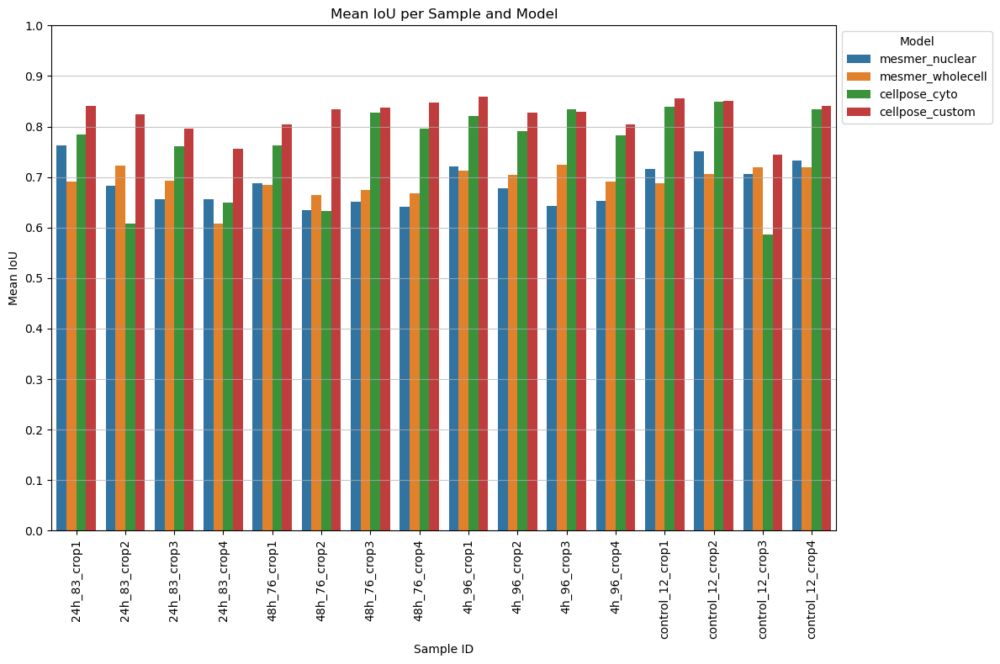

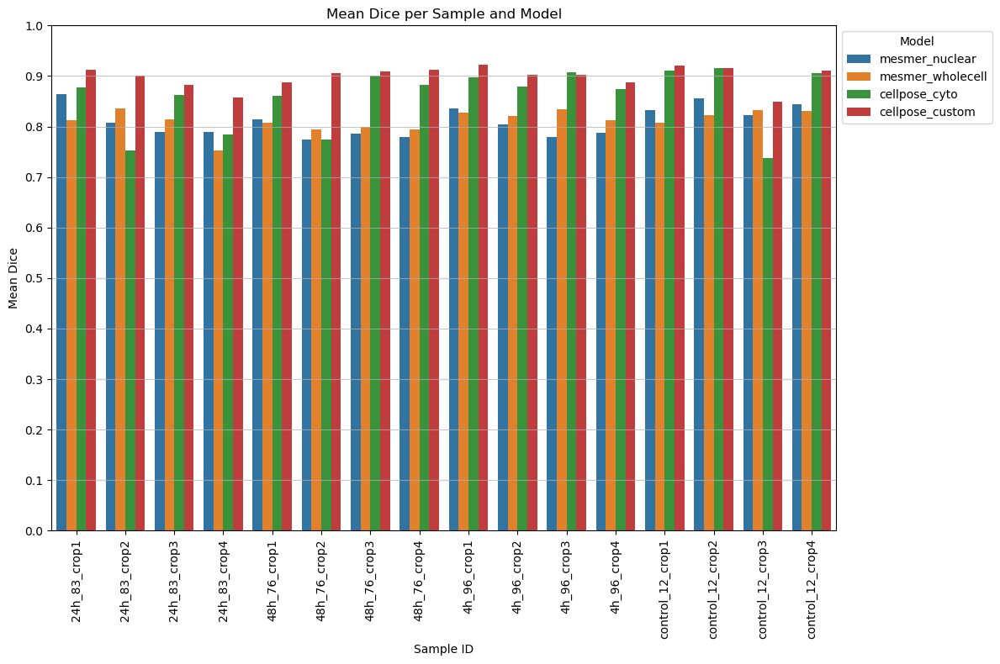

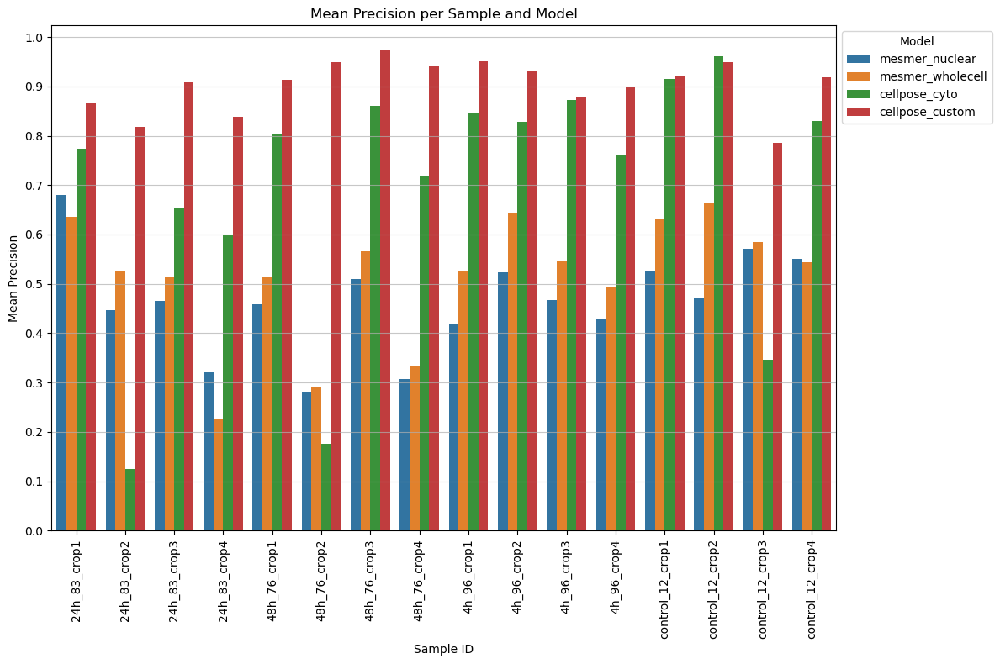

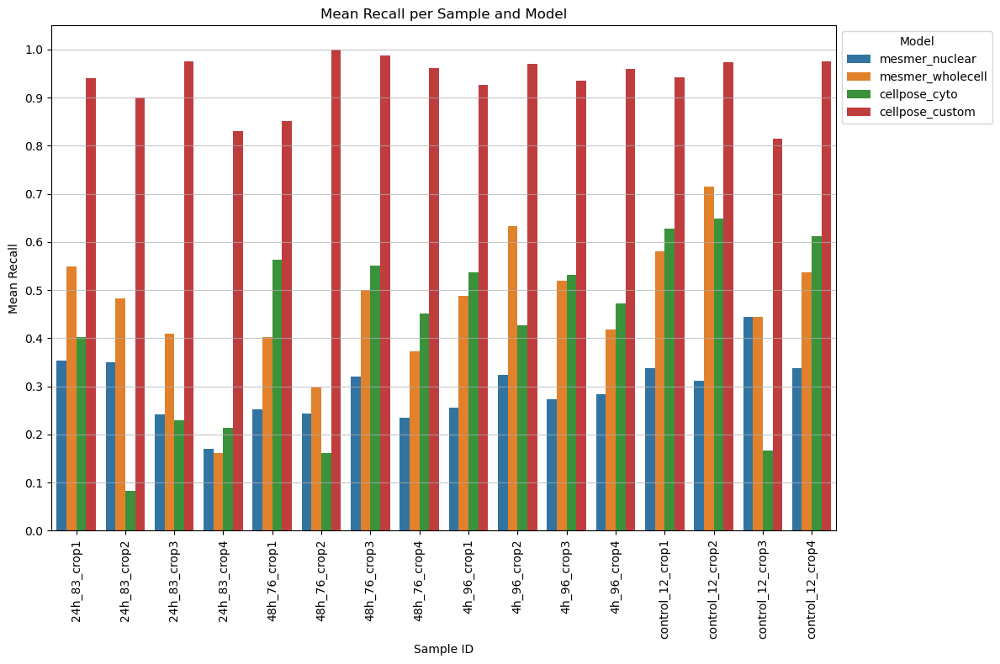

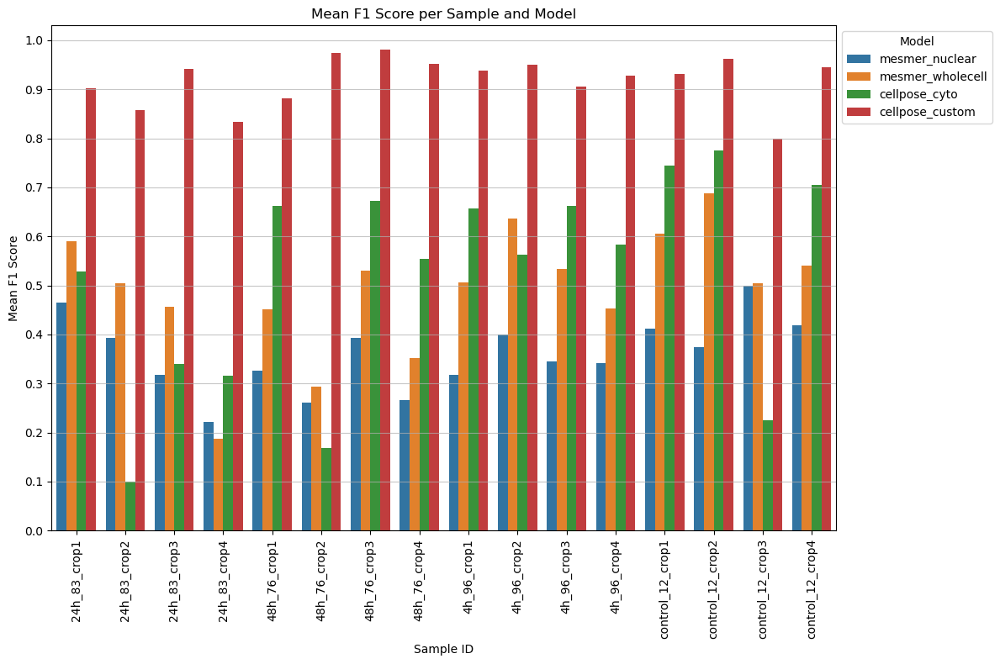

...

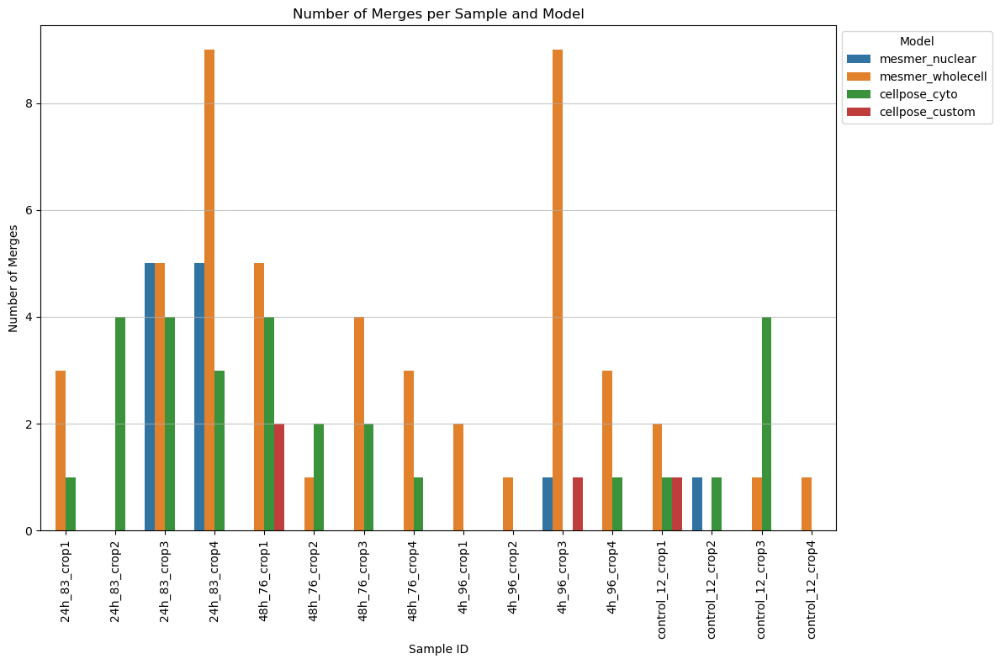

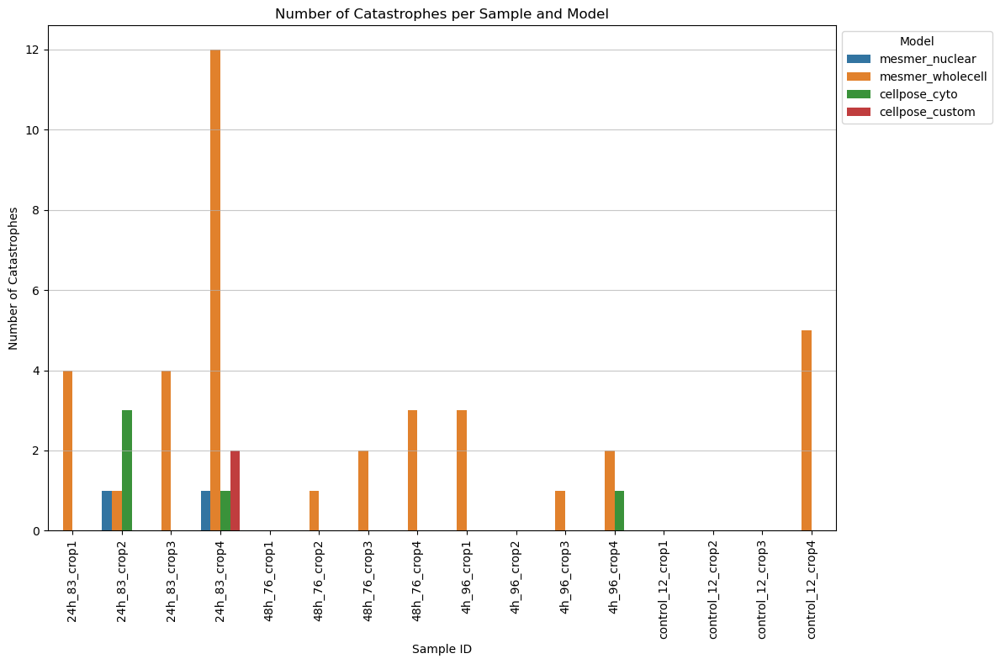

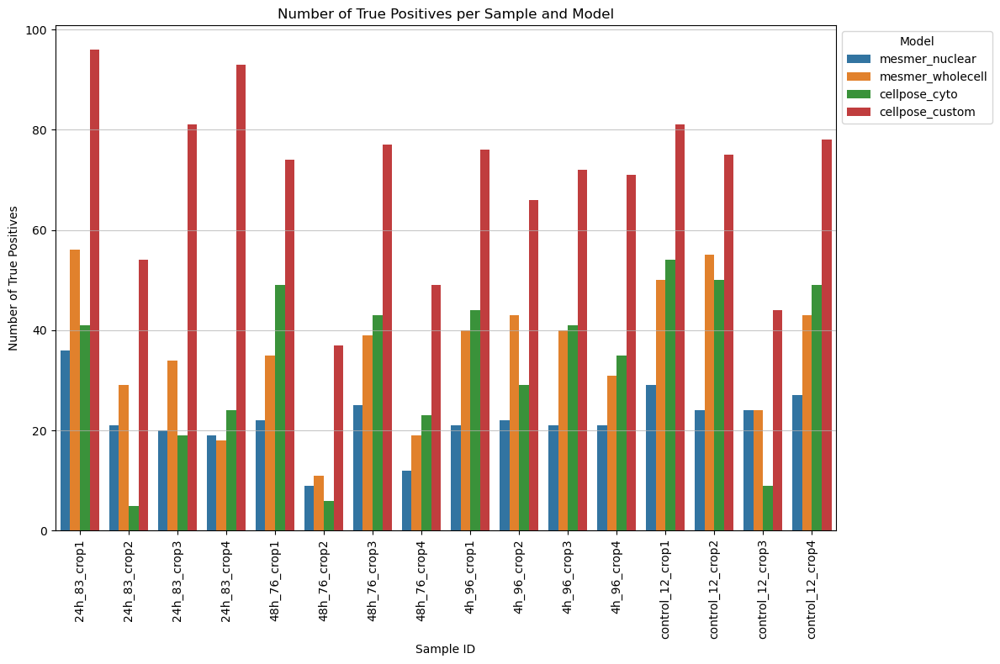

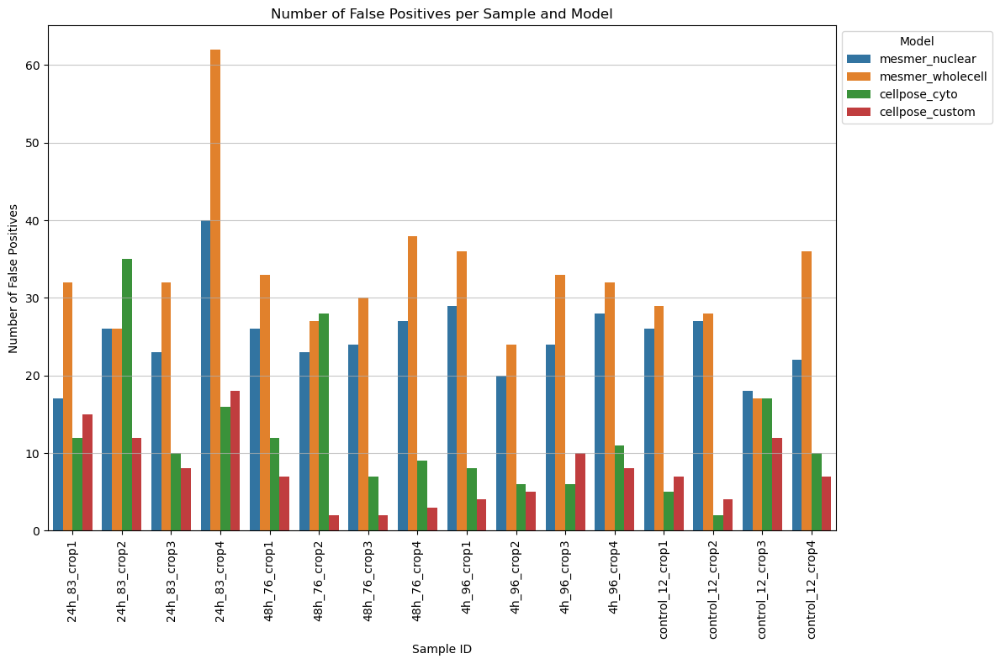

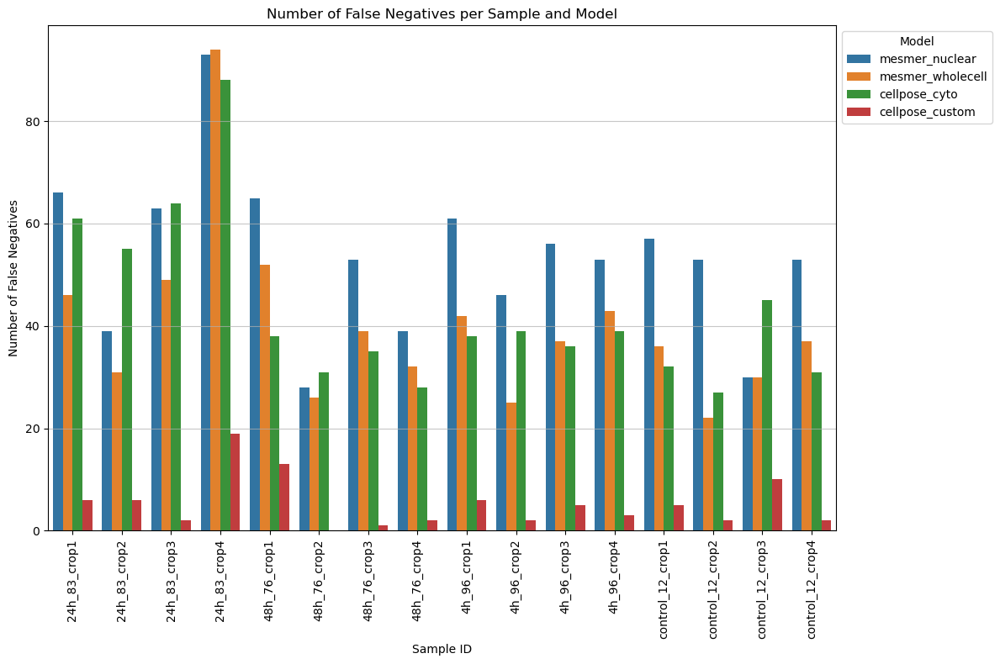

In [129]:
# report per sample-model combination (sampleID and model) the following metrics: iou_mean, dice_mean, precision, recall, f1_score, splits, merges, catastrophes, true_positives, false_positives, false_negatives
report_df = crop_df.groupby(['sampleID', 'model']).agg({
    'iou_mean': 'mean',
    'dice_mean': 'mean',
    'precision': 'mean',
    'recall': 'mean',
    'f1_score': 'mean',
    'splits': 'sum',
    'merges': 'sum',
    'catastrophes': 'sum',
    'true_positives': 'sum',
    'false_positives': 'sum',
    'false_negatives': 'sum'
}).reset_index()

# visualize report_df - when showing models, first show mesmer_nuclear, then mesmer_wholecell, then cellpose_cyto, then cellpose_custom
model_list = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
report_df['model'] = pd.Categorical(report_df['model'], categories=model_list, ordered=True)
report_df = report_df.sort_values(by=['sampleID', 'model'])
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='iou_mean', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.grid(axis='y', alpha=0.7)
plt.title('Mean IoU per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Mean IoU')
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='dice_mean', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Mean Dice per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Mean Dice')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='precision', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Mean Precision per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Mean Precision')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='recall', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Mean Recall per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Mean Recall')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='f1_score', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Mean F1 Score per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Mean F1 Score')
plt.yticks(np.arange(0, 1.1, 0.1))
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='splits', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Number of Splits per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Number of Splits')
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='merges', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Number of Merges per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Number of Merges')
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='catastrophes', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Number of Catastrophes per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Number of Catastrophes')
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='true_positives', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Number of True Positives per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Number of True Positives')
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='false_positives', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Number of False Positives per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Number of False Positives')
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
sns.barplot(data=report_df, x='sampleID', y='false_negatives', hue='model', order=report_df['sampleID'].unique())
plt.xticks(rotation=90)
plt.title('Number of False Negatives per Sample and Model')
plt.xlabel('Sample ID')
plt.ylabel('Number of False Negatives')
plt.grid(axis='y', alpha=0.7)
plt.legend(title='Model', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()


report_df.to_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/segmentation_report_per_crop.csv', index=False)

# Code for initial segmentation evaluation for the first revision:

In [6]:
import tifffile
import pandas as pd
import numpy as np
import os

def normalize_matrix_gt(matrix, labels, mask):
    norm_matrix = matrix.copy()
    for i, label in enumerate(labels):
        if label == 0:
            continue
        p_mask = mask == label
        norm_matrix[i,:] = matrix[i,:] / p_mask.sum()
    return norm_matrix

def normalize_matrix_pred(matrix, labels, mask):
    norm_matrix = matrix.copy()
    for i, label in enumerate(labels):
        if label == 0:
            continue
        p_mask = mask == label
        norm_matrix[:,i] = matrix[:,i] / p_mask.sum()
    return norm_matrix

def overlap_matrix_calc(ground_truth, prediction):
    # Create arrays for unique labels in the ground truth and prediction
    unique_gt_labels = np.unique(ground_truth)
    if 0 in unique_gt_labels:
        unique_gt_labels = unique_gt_labels[1:]
    unique_pred_labels = np.unique(prediction)
    if 0 in unique_pred_labels:
        unique_pred_labels = unique_pred_labels[1:]
    
    # Initialize the overlap matrix
    overlap_matrix = np.zeros((len(unique_gt_labels), len(unique_pred_labels)))
    
    # Fill in the overlap matrix with pixel counts
    for i, gt_label in enumerate(unique_gt_labels):
        if gt_label == 0:  # Skip background label
            continue
        gt_mask = ground_truth == gt_label
        for j, pred_label in enumerate(unique_pred_labels):
            if pred_label == 0:  # Skip background label
                continue
            pred_mask = prediction == pred_label
            overlap_matrix[i, j] = np.sum(np.logical_and(gt_mask, pred_mask))
    
    return overlap_matrix, unique_gt_labels, unique_pred_labels

def cell_matching(ground_truth, prediction, overlap_threshold=0.5):
    overlap_matrix, unique_gt_labels, unique_pred_labels = overlap_matrix_calc(ground_truth, prediction)

    norm_overlap_matrix_GT = normalize_matrix_gt(overlap_matrix, unique_gt_labels, ground_truth)
    norm_overlap_matrix_pred = normalize_matrix_pred(overlap_matrix, unique_pred_labels, prediction)

    ttp_perfect_match = np.where(np.logical_and(norm_overlap_matrix_pred>overlap_threshold, norm_overlap_matrix_GT>overlap_threshold))
    match_df = pd.DataFrame({'gt_label': unique_gt_labels[ttp_perfect_match[0]], 'pred_label': unique_pred_labels[ttp_perfect_match[1]]})

    ttp_gts = set(unique_gt_labels[ttp_perfect_match[0]])
    ttp_preds = set(unique_pred_labels[ttp_perfect_match[1]])

    fp_preds = set()
    fn_gts = set()

    # HANDLING OVERSEGMENTATION CASES
    oversegmentation_cases = []
    for i, gt_label in enumerate(unique_gt_labels):
        if gt_label == 0:
            continue
        overlap_matches = np.where(norm_overlap_matrix_pred[i,:]>overlap_threshold)[0]    
        # in case multiple predicted cells are matched to the same GT cell, combine them into one and add false positive counts
        if len(overlap_matches) > 1:
            for j in range(len(overlap_matches)):
                oversegmentation_cases.append((gt_label, unique_pred_labels[overlap_matches[j]]))

    # create pandas df from oversegmentation_cases tuple
    oversegmentation_df = pd.DataFrame(oversegmentation_cases, columns=['gt_label', 'pred_label'])
    oversegmentation_df_left = oversegmentation_df.copy()
    oversegmentation_df_right = pd.DataFrame(columns=['gt_label', 'pred_label'])

    # check if any second value in oversegmentation_cases is in ttp_preds. If so, replace the respective gt_label with the ttp_preds matched label
    for i, gt_label in enumerate(oversegmentation_df.gt_label):
        if oversegmentation_df.pred_label[i] in ttp_preds:

            oversegmentation_df_right = pd.concat([oversegmentation_df_right, oversegmentation_df[oversegmentation_df.gt_label == gt_label]])
            oversegmentation_df_right.loc[oversegmentation_df_right.gt_label == gt_label, 'gt_label'] = oversegmentation_df.pred_label[i]
            oversegmentation_df_left = oversegmentation_df_left[oversegmentation_df_left.gt_label != gt_label]

    for i, gt_label in enumerate(oversegmentation_df_left.gt_label.unique()):
        addition_to_df = oversegmentation_df_left[oversegmentation_df_left.gt_label == gt_label]
        pred_for_group = addition_to_df.pred_label.unique()[0]
        addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
        oversegmentation_df_right = pd.concat([oversegmentation_df_right, addition_to_df])

    fp_preds.update(set(oversegmentation_df_right.pred_label.unique()) - set(oversegmentation_df_right.gt_label.unique()))

    oversegmentation_df_left = oversegmentation_df.copy()
    for i, pred_label in enumerate(oversegmentation_df_left.pred_label):
        if pred_label in fp_preds:
            oversegmentation_df_left = oversegmentation_df_left[oversegmentation_df_left.pred_label != pred_label]

    prediction_relabel = prediction.copy()
    for i, row in oversegmentation_df_right.iterrows():
        prediction_relabel[prediction_relabel == row.pred_label] = row.gt_label

    match_df = pd.concat([match_df, oversegmentation_df_left])
    match_df = match_df.drop_duplicates()
    ttp_preds.update(set(oversegmentation_df_left.pred_label.unique()))
    ttp_gts.update(set(oversegmentation_df_left.gt_label.unique()))

    # HANDLING UNDERSEGMENTATION CASES
    undersegmentation_cases = []
    for i, pred_label in enumerate(unique_pred_labels):
        if pred_label == 0:
            continue
        overlap_matches = np.where(norm_overlap_matrix_GT[:,i]>overlap_threshold)[0]

        # in case multiple predicted cells are matched to the same GT cell, combine them into one and add false positive counts
        if len(overlap_matches) > 1:
            for j in range(len(overlap_matches)):
                undersegmentation_cases.append((unique_gt_labels[overlap_matches[j]], pred_label))

    # create pandas df from oversegmentation_cases tuple
    undersegmentation_df = pd.DataFrame(undersegmentation_cases, columns=['gt_label', 'pred_label'])
    undersegmentation_df_left = undersegmentation_df.copy()
    undersegmentation_df_right = pd.DataFrame(columns=['gt_label', 'pred_label'])

    for i, pred_label in enumerate(undersegmentation_df.pred_label):
        if undersegmentation_df.gt_label[i] in ttp_gts:
            undersegmentation_df_right = pd.concat([undersegmentation_df_right, undersegmentation_df[undersegmentation_df.pred_label == pred_label]])
            undersegmentation_df_right.loc[undersegmentation_df_right.pred_label == pred_label, 'pred_label'] = undersegmentation_df.gt_label[i]
            undersegmentation_df_left = undersegmentation_df_left[undersegmentation_df_left.pred_label != pred_label]

    for i, pred_label in enumerate(undersegmentation_df_left.pred_label.unique()):
        addition_to_df = undersegmentation_df_left[undersegmentation_df_left.pred_label == pred_label]
        gt_for_group = addition_to_df.gt_label.unique()[0]
        addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group
        undersegmentation_df_right = pd.concat([undersegmentation_df_right, addition_to_df])

    fn_gts.update(set(undersegmentation_df_right.gt_label.unique()) - set(undersegmentation_df_right.pred_label.unique()))

    undersegmentation_df_left = undersegmentation_df.copy()
    for i, gt_label in enumerate(undersegmentation_df_left.gt_label):
        if gt_label in fn_gts:
            undersegmentation_df_left = undersegmentation_df_left[undersegmentation_df_left.gt_label != gt_label]

    match_df = pd.concat([match_df, undersegmentation_df_left])
    match_df = match_df.drop_duplicates()

    ttp_preds.update(set(undersegmentation_df_left.pred_label.unique()))
    ttp_gts.update(set(undersegmentation_df_left.gt_label.unique()))

    # rename the GT to apply undersegmentation strategy (adding FN counts, but combining respective GT cells)
    ground_truth_relabel = ground_truth.copy()
    for i, row in undersegmentation_df_right.iterrows():
        initial_label, final_label = row.gt_label, row.pred_label
        ground_truth_relabel[ground_truth_relabel == initial_label] = final_label

    for label in set(unique_gt_labels) - {0} - ttp_gts:
        ground_truth_relabel[ground_truth_relabel == label] = 0

    for label in set(unique_pred_labels) - {0} - ttp_preds:
        prediction_relabel[prediction_relabel == label] = 0

    for i, row in match_df.iterrows():
        prediction_relabel[prediction_relabel == row.pred_label] = row.gt_label

    fn_gts.update(set(unique_gt_labels) - ttp_gts)
    fp_preds.update(set(unique_pred_labels) - ttp_preds)

    validate_overlap_matrix, validate_gt_labels, validate_pred_labels = overlap_matrix_calc(ground_truth_relabel, prediction_relabel)

    validate_norm_overlap_matrix_GT = normalize_matrix_gt(validate_overlap_matrix, validate_gt_labels, ground_truth_relabel)
    validate_norm_overlap_matrix_pred = normalize_matrix_pred(validate_overlap_matrix, validate_pred_labels, prediction_relabel)

    validate_ttp_perfect_match = np.where(np.logical_and(validate_norm_overlap_matrix_pred>overlap_threshold, validate_norm_overlap_matrix_GT>overlap_threshold))

    validate_match_df = pd.DataFrame({'gt_label': validate_gt_labels[validate_ttp_perfect_match[0]], 'pred_label': validate_pred_labels[validate_ttp_perfect_match[1]]})

    missing_gt_labels = set(match_df.gt_label) - set(validate_match_df.gt_label)
    missing_pred_labels = set()
    for gt_label in missing_gt_labels:
        missing_pred_labels.update(match_df[match_df.gt_label == gt_label].pred_label)
    fp_preds.update(missing_pred_labels)
    ttp_gts = ttp_gts - missing_gt_labels
    ttp_preds = ttp_preds - missing_pred_labels
    fn_gts.update(missing_gt_labels)

    final_relabel_gt = ground_truth_relabel.copy()
    for label in missing_gt_labels:
        final_relabel_gt[final_relabel_gt == label] = 0

    final_relabel_pred = prediction_relabel.copy()
    for label in missing_pred_labels:
        final_relabel_pred[final_relabel_pred == label] = 0

    total_true_positives = len(ttp_gts)
    total_false_positives = len(fp_preds)
    total_false_negatives = len(fn_gts)

    print(f'TTP preds and TTP GTs is equal? {len(ttp_gts)==len(ttp_preds)}')

    return final_relabel_gt, final_relabel_pred, total_true_positives, total_false_positives, total_false_negatives


### Run this to get the segmentation metrics (0s added for FNs and FPs)

In [7]:
GT_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations'
models = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
segmentation_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/segmentation/'

seg_eval_metrics = {
        "sample":[],
        "cropID":[],
        "model":[],
        "mean_iou":[],
        "mean_dice":[],
        "precision":[],
        "recall":[],
        "f1_score":[],
        "gt_cells":[],
        "predicted_cells":[]
        }
seg_eval_metrics_df = pd.DataFrame(seg_eval_metrics)

# define sample list as all unique values in the GT_dir listdir when only looking at the string before the second underscore (the first should be included in the sample id)
samples = ["_".join((os.path.splitext(os.path.basename(file))[0].split('_')[0], os.path.splitext(os.path.basename(file))[0].split('_')[1])) for file in os.listdir(GT_dir)]
samples = list(set(samples))

GT_list = []
prediction_list = []
all_iou_total = []
all_dice_total = []
gt_cells = 0
pred_cells = 0

# create a pandas df with model, total_true_positives, total_false_positives, total_false_negatives, total_oversegmentation, total_undersegmentation, mean_iou_all_cells, mean_dice_all_cells, precision, recall, f1_score
results_df = pd.DataFrame(columns=['model', 'total_true_positives', 'total_false_positives', 'total_false_negatives', 'mean_iou_all_cells', 'mean_dice_all_cells', 'precision', 'recall', 'f1_score'])

for model in models:

    all_iou_scores = []
    all_dice_scores = []
    total_true_positives = 0
    total_false_positives = 0
    total_false_negatives = 0
    gt_cells = 0
    pred_cells = 0

    for sample in samples:
        for cropID in range(1,10):
            # if the file does not exist, skip it
            if os.path.exists(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'):
                # load the ground truth image
                GT_image = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
                GT_list.append(GT_image)

                # define the segmentation tool and model
                seg_tool = model.split("_")[0]
                seg_model = model.split("_")[1]

                prediction = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
                prediction_list.append(prediction)

    print(model)
    print(len(GT_list))
    crop_counter = 0
    # Loop through all crops
    for ground_truth, prediction in zip(GT_list, prediction_list):
        print(crop_counter)
        crop_counter+=1

        # Match the cells
        ground_truth_relabel, pred_relabel, TTP, FP, FN = cell_matching(ground_truth, prediction, overlap_threshold=0.5)
        print(TTP, FP, FN)
    
        unique_gt_labels = np.unique(ground_truth_relabel)

        unique_pred_labels = np.unique(pred_relabel)
        if 0 in unique_gt_labels:
            unique_gt_labels = unique_gt_labels[1:]
        if 0 in unique_pred_labels:
            unique_pred_labels = unique_pred_labels[1:]

        gt_labels = unique_gt_labels
        gt_all_labels = np.unique(ground_truth)
        if 0 in gt_all_labels:
            gt_all_labels = gt_all_labels[1:]

        pred_labels = unique_pred_labels
        pred_all_labels = np.unique(prediction)
        if 0 in pred_all_labels:
            pred_all_labels = pred_all_labels[1:]

        pred_cells += len(pred_all_labels)
        gt_cells += len(gt_all_labels)

        for label in gt_labels:
            gt_binary = ground_truth_relabel == label
            pred_binary = pred_relabel == label
            
            # Compute Intersection over Union (IoU)
            intersection = np.logical_and(gt_binary, pred_binary).sum()
            union = np.logical_or(gt_binary, pred_binary).sum()
            iou = intersection / union if union != 0 else 0
            all_iou_scores.append(iou)

            # Compute Dice Coefficient
            dice = (2 * intersection) / (gt_binary.sum() + pred_binary.sum()) if (gt_binary.sum() + pred_binary.sum()) != 0 else 0
            all_dice_scores.append(dice)

        # Accumulate true positives, false positives and false negatives
        total_true_positives += TTP
        total_false_positives += FP
        total_false_negatives += FN
        # append 0s for false negatives and false positives
        all_iou_scores += [0]*FN
        all_iou_scores += [0]*FP
        # append 0s for false negatives and false positives
        all_dice_scores += [0]*FN
        all_dice_scores += [0]*FP

    # Mean IoU and Dice over all cells
    mean_iou_all_cells = np.mean(all_iou_scores) if all_iou_scores else 0
    mean_dice_all_cells = np.mean(all_dice_scores) if all_dice_scores else 0
    
    # Precision and Recall
    precision = total_true_positives / (total_true_positives + total_false_positives) if (total_true_positives + total_false_positives) > 0 else 0
    recall = total_true_positives / (total_true_positives + total_false_negatives) if (total_true_positives + total_false_negatives) > 0 else 0
    
    # F1-Score (Harmonic mean of Precision and Recall)
    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
                
    results_df = pd.concat([results_df, pd.DataFrame({
        'model': [model],
        'total_true_positives': [total_true_positives],
        'total_false_positives': [total_false_positives],
        'total_false_negatives': [total_false_negatives],
        'mean_iou_all_cells': [mean_iou_all_cells],
        'mean_dice_all_cells': [mean_dice_all_cells],
        'precision': [precision],
        'recall': [recall],
        'f1_score': [f1_score],
        'GT_cells': [gt_cells],
        'predicted_cells': [pred_cells]
    })])
    all_iou_total.append(all_iou_scores)
    all_dice_total.append(all_dice_scores)
    GT_list = []
    prediction_list = []

    print(f'model {model} processed')

results_df['total_cells'] = results_df['total_true_positives'] + results_df['total_false_positives'] + results_df['total_false_negatives']
results_df['sum_of_TTP_FN'] = results_df['total_true_positives'] + results_df['total_false_negatives']
results_df['sum_of_TTP_FP'] = results_df['total_true_positives'] + results_df['total_false_positives']
results_df.reset_index(drop=True, inplace=True)

mesmer_nuclear
16
0


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
36 17 66
1


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
22 25 38
2


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
24 19 59
3


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
23 36 89
4


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
29 26 57
5


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
25 26 52
6


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
26 16 28
7


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
27 22 53
8


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
24 24 63
9
TTP preds and TTP GTs is equal? True
10 22 27
10
TTP preds and TTP GTs is equal? True
25 24 53
11


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
12 27 39
12


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
22 28 60
13


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
22 20 46
14
TTP preds and TTP GTs is equal? True
23 22 54
15
TTP preds and TTP GTs is equal? True
23 26 51
model mesmer_nuclear processed
mesmer_wholecell
16
0


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/755241825.py:127: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, pd.DataFrame({
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
62 26 40
1


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
32 23 28
2


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
38 28 45
3


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
32 48 80
4


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
51 28 35
5


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
57 26 20
6


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
25 16 29
7


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
51 28 29
8


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
40 28 47
9
TTP preds and TTP GTs is equal? True
12 26 25


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


10


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
40 29 38
11


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
27 30 24
12


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
46 30 36
13


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
46 21 22
14


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
48 25 29
15


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
38 25 36
model mesmer_wholecell processed
cellpose_cyto
16
0
TTP preds and TTP GTs is equal? True
42 11 60
1


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
7 33 53
2
TTP preds and TTP GTs is equal? True
22 7 61
3


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
28 12 84
4
TTP preds and TTP GTs is equal? True
54 5 32
5
TTP preds and TTP GTs is equal? True
50 2 27
6
TTP preds and TTP GTs is equal? True
9 17 45
7
TTP preds and TTP GTs is equal? True
50 9 30
8


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
54 7 33
9
TTP preds and TTP GTs is equal? True
7 27 30
10


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
44 6 34
11
TTP preds and TTP GTs is equal? True
24 8 27
12
TTP preds and TTP GTs is equal? True
44 8 38
13
TTP preds and TTP GTs is equal? True
29 6 39
14
TTP preds and TTP GTs is equal? True
42 5 35
15
TTP preds and TTP GTs is equal? True
38 8 36
model cellpose_cyto processed
cellpose_custom
16
0
TTP preds and TTP GTs is equal? True
97 14 5
1
TTP preds and TTP GTs is equal? True
55 11 5
2
TTP preds and TTP GTs is equal? True
81 8 2
3
TTP preds and TTP GTs is equal? True
96 15 16
4
TTP preds and TTP GTs is equal? True
82 6 4
5
TTP preds and TTP GTs is equal? True
75 4 2
6
TTP preds and TTP GTs is equal? True
45 11 9
7
TTP preds and TTP GTs is equal? True
78 7 2
8
TTP preds and TTP GTs is equal? True
76 5 11
9
TTP preds and TTP GTs is equal? True
37 2 0
10
TTP preds and TTP GTs is equal? True
77 2 1
11
TTP preds and TTP GTs is equal? True
49 3 2
12
TTP preds and TTP GTs is equal? True
76 4 6
13
TTP preds and TTP GTs is equal? True
68 3 0
14
TTP preds

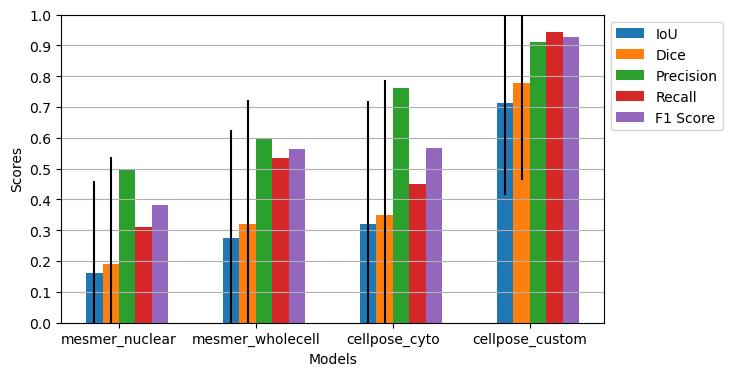

In [8]:
import matplotlib.pyplot as plt
# create plot with error bars for 4 groups: all_iou_total where all_dice_total[0] denotes mesmer_nuclear model, 1 for mesmer_wholecell, 2 for cellpose_cyto, 3 for cellpose_custom
# calculate mean and standard deviation for each group
mean_iou = [np.mean(all_iou_total[0]), np.mean(all_iou_total[1]), np.mean(all_iou_total[2]), np.mean(all_iou_total[3])]
std_iou = [np.std(all_iou_total[0]), np.std(all_iou_total[1]), np.std(all_iou_total[2]), np.std(all_iou_total[3])]
# get standard error

mean_dice = [np.mean(all_dice_total[0]), np.mean(all_dice_total[1]), np.mean(all_dice_total[2]), np.mean(all_dice_total[3])]
std_dice = [np.std(all_dice_total[0]), np.std(all_dice_total[1]), np.std(all_dice_total[2]), np.std(all_dice_total[3])]
precision = [results_df.precision.values[0], results_df.precision.values[1], results_df.precision.values[2], results_df.precision.values[3]]
recall = [results_df.recall.values[0], results_df.recall.values[1], results_df.recall.values[2], results_df.recall.values[3]]
f1_score = [results_df.f1_score.values[0], results_df.f1_score.values[1], results_df.f1_score.values[2], results_df.f1_score.values[3]]

x = np.arange(len(models))

fig, ax = plt.subplots()
# make figzie bigger
fig.set_size_inches(7, 4)
# add dice score with offset (per bar, should be left side iou, right side dice)
bar_width = 0.12
ax.bar(x, mean_iou, bar_width, yerr=std_iou, label='IoU')
ax.bar(x + bar_width, mean_dice, bar_width, yerr=std_dice, label='Dice')
ax.bar(x + bar_width*2, precision, bar_width, label='Precision')
ax.bar(x + bar_width*3, recall, bar_width, label='Recall')
ax.bar(x + bar_width*4, f1_score, bar_width, label='F1 Score')
ax.set_xlabel('Models')

ax.set_ylabel('Scores')
ax.set_xticks(x)
# move x ticks by 2 bar widths to the right
ax.set_xticks(x + bar_width*1.5)
ax.set_xticklabels(models)
ax.set_title
ax.yaxis.grid(True)
# cap 1 axis at 1
ax.set_ylim(0, 1)
ax.yaxis.set_major_locator(plt.MultipleLocator(0.1))
# put legend left
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()
# save plot
fig.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/segmentation_evaluation_results.png', bbox_inches='tight')

In [9]:
results_df.to_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/segmentation_evaluation_results.csv', index=False)

### Use this to create segmentation evaluation metrics without 0 for oversegmentation and undersegmentation cases - precision, recall and F1 score take into account the FPs and FNs, and iou and dice only take into account the segmentation quality itself.

In [11]:
GT_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations'
models = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
segmentation_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/segmentation/'

seg_eval_metrics = {
        "sample":[],
        "cropID":[],
        "model":[],
        "mean_iou":[],
        "mean_dice":[],
        "precision":[],
        "recall":[],
        "f1_score":[],
        "gt_cells":[],
        "predicted_cells":[]
        }
seg_eval_metrics_df = pd.DataFrame(seg_eval_metrics)

# define sample list as all unique values in the GT_dir listdir when only looking at the string before the second underscore (the first should be included in the sample id)
samples = ["_".join((os.path.splitext(os.path.basename(file))[0].split('_')[0], os.path.splitext(os.path.basename(file))[0].split('_')[1])) for file in os.listdir(GT_dir)]
samples = list(set(samples))

GT_list = []
prediction_list = []
all_iou_total = []
all_dice_total = []
gt_cells = 0
pred_cells = 0

# create a pandas df with model, total_true_positives, total_false_positives, total_false_negatives, total_oversegmentation, total_undersegmentation, mean_iou_all_cells, mean_dice_all_cells, precision, recall, f1_score
results_df = pd.DataFrame(columns=['model', 'total_true_positives', 'total_false_positives', 'total_false_negatives', 'mean_iou_all_cells', 'mean_dice_all_cells', 'precision', 'recall', 'f1_score'])

for model in models:

    all_iou_scores = []
    all_dice_scores = []
    total_true_positives = 0
    total_false_positives = 0
    total_false_negatives = 0
    gt_cells = 0
    pred_cells = 0

    for sample in samples:
        for cropID in range(1,10):
            # if the file does not exist, skip it
            if os.path.exists(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'):
                # load the ground truth image
                GT_image = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
                GT_list.append(GT_image)

                # define the segmentation tool and model
                seg_tool = model.split("_")[0]
                seg_model = model.split("_")[1]

                prediction = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
                prediction_list.append(prediction)

    print(model)
    print(len(GT_list))
    crop_counter = 0
    # Loop through all crops
    for ground_truth, prediction in zip(GT_list, prediction_list):
        print(crop_counter)
        crop_counter+=1

        # Match the cells
        ground_truth_relabel, pred_relabel, TTP, FP, FN = cell_matching(ground_truth, prediction, overlap_threshold=0.5)
        print(TTP, FP, FN)
    
        unique_gt_labels = np.unique(ground_truth_relabel)

        unique_pred_labels = np.unique(pred_relabel)
        if 0 in unique_gt_labels:
            unique_gt_labels = unique_gt_labels[1:]
        if 0 in unique_pred_labels:
            unique_pred_labels = unique_pred_labels[1:]

        gt_labels = unique_gt_labels
        gt_all_labels = np.unique(ground_truth)
        if 0 in gt_all_labels:
            gt_all_labels = gt_all_labels[1:]

        pred_labels = unique_pred_labels
        pred_all_labels = np.unique(prediction)
        if 0 in pred_all_labels:
            pred_all_labels = pred_all_labels[1:]

        pred_cells += len(pred_all_labels)
        gt_cells += len(gt_all_labels)

        for label in gt_labels:
            gt_binary = ground_truth_relabel == label
            pred_binary = pred_relabel == label
            
            # Compute Intersection over Union (IoU)
            intersection = np.logical_and(gt_binary, pred_binary).sum()
            union = np.logical_or(gt_binary, pred_binary).sum()
            iou = intersection / union if union != 0 else 0
            all_iou_scores.append(iou)

            # Compute Dice Coefficient
            dice = (2 * intersection) / (gt_binary.sum() + pred_binary.sum()) if (gt_binary.sum() + pred_binary.sum()) != 0 else 0
            all_dice_scores.append(dice)

        # Accumulate true positives, false positives and false negatives
        total_true_positives += TTP
        total_false_positives += FP
        total_false_negatives += FN

    # Mean IoU and Dice over all cells
    mean_iou_all_cells = np.mean(all_iou_scores) if all_iou_scores else 0
    mean_dice_all_cells = np.mean(all_dice_scores) if all_dice_scores else 0
    
    # Precision and Recall
    precision = total_true_positives / (total_true_positives + total_false_positives) if (total_true_positives + total_false_positives) > 0 else 0
    recall = total_true_positives / (total_true_positives + total_false_negatives) if (total_true_positives + total_false_negatives) > 0 else 0
    
    # F1-Score (Harmonic mean of Precision and Recall)
    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
                
    results_df = pd.concat([results_df, pd.DataFrame({
        'model': [model],
        'total_true_positives': [total_true_positives],
        'total_false_positives': [total_false_positives],
        'total_false_negatives': [total_false_negatives],
        'mean_iou_all_cells': [mean_iou_all_cells],
        'mean_dice_all_cells': [mean_dice_all_cells],
        'precision': [precision],
        'recall': [recall],
        'f1_score': [f1_score],
        'GT_cells': [gt_cells],
        'predicted_cells': [pred_cells]
    })])
    all_iou_total.append(all_iou_scores)
    all_dice_total.append(all_dice_scores)
    GT_list = []
    prediction_list = []

    print(f'model {model} processed')

results_df['total_cells'] = results_df['total_true_positives'] + results_df['total_false_positives'] + results_df['total_false_negatives']
results_df['sum_of_TTP_FN'] = results_df['total_true_positives'] + results_df['total_false_negatives']
results_df['sum_of_TTP_FP'] = results_df['total_true_positives'] + results_df['total_false_positives']
results_df.reset_index(drop=True, inplace=True)

mesmer_nuclear
16
0


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
36 17 66
1


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
22 25 38
2


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
24 19 59
3


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
23 36 89
4


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
29 26 57
5


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
25 26 52
6


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
26 16 28
7


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
27 22 53
8


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
24 24 63
9
TTP preds and TTP GTs is equal? True
10 22 27
10


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
25 24 53
11


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
12 27 39
12


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
22 28 60
13


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
22 20 46
14
TTP preds and TTP GTs is equal? True
23 22 54
15
TTP preds and TTP GTs is equal? True
23 26 51
model mesmer_nuclear processed
mesmer_wholecell
16
0


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/3300603699.py:121: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, pd.DataFrame({
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
62 26 40
1


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
32 23 28
2


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
38 28 45
3


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
32 48 80
4


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
51 28 35
5


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
57 26 20
6


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
25 16 29
7


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
51 28 29
8


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
40 28 47
9
TTP preds and TTP GTs is equal? True
12 26 25


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


10


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
40 29 38
11


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
27 30 24
12


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
46 30 36
13


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
46 21 22
14


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
48 25 29
15


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
38 25 36
model mesmer_wholecell processed
cellpose_cyto
16
0
TTP preds and TTP GTs is equal? True
42 11 60
1


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group
/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
7 33 53
2
TTP preds and TTP GTs is equal? True
22 7 61
3


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
28 12 84
4
TTP preds and TTP GTs is equal? True
54 5 32
5
TTP preds and TTP GTs is equal? True
50 2 27
6
TTP preds and TTP GTs is equal? True
9 17 45
7
TTP preds and TTP GTs is equal? True
50 9 30
8


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:136: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.pred_label == pred_label, 'pred_label'] = gt_for_group


TTP preds and TTP GTs is equal? True
54 7 33
9
TTP preds and TTP GTs is equal? True
7 27 30
10


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_879/1098650657.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  addition_to_df.loc[addition_to_df.gt_label == gt_label, 'gt_label'] = pred_for_group


TTP preds and TTP GTs is equal? True
44 6 34
11
TTP preds and TTP GTs is equal? True
24 8 27
12
TTP preds and TTP GTs is equal? True
44 8 38
13
TTP preds and TTP GTs is equal? True
29 6 39
14
TTP preds and TTP GTs is equal? True
42 5 35
15
TTP preds and TTP GTs is equal? True
38 8 36
model cellpose_cyto processed
cellpose_custom
16
0
TTP preds and TTP GTs is equal? True
97 14 5
1
TTP preds and TTP GTs is equal? True
55 11 5
2
TTP preds and TTP GTs is equal? True
81 8 2
3
TTP preds and TTP GTs is equal? True
96 15 16
4
TTP preds and TTP GTs is equal? True
82 6 4
5
TTP preds and TTP GTs is equal? True
75 4 2
6
TTP preds and TTP GTs is equal? True
45 11 9
7
TTP preds and TTP GTs is equal? True
78 7 2
8
TTP preds and TTP GTs is equal? True
76 5 11
9
TTP preds and TTP GTs is equal? True
37 2 0
10
TTP preds and TTP GTs is equal? True
77 2 1
11
TTP preds and TTP GTs is equal? True
49 3 2
12
TTP preds and TTP GTs is equal? True
76 4 6
13
TTP preds and TTP GTs is equal? True
68 3 0
14
TTP preds

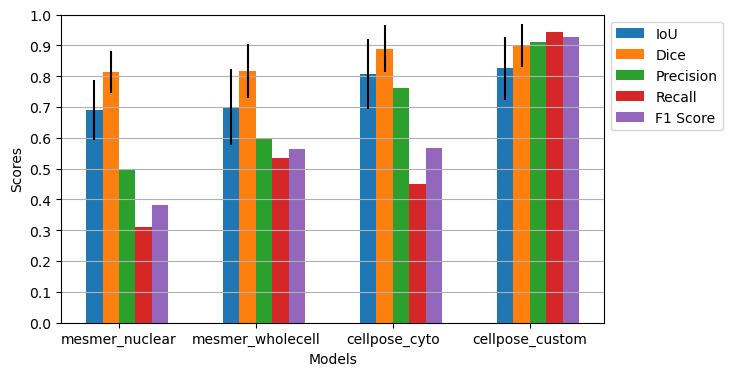

In [12]:
import matplotlib.pyplot as plt
mean_iou = [np.mean(all_iou_total[0]), np.mean(all_iou_total[1]), np.mean(all_iou_total[2]), np.mean(all_iou_total[3])]
std_iou = [np.std(all_iou_total[0]), np.std(all_iou_total[1]), np.std(all_iou_total[2]), np.std(all_iou_total[3])]

mean_dice = [np.mean(all_dice_total[0]), np.mean(all_dice_total[1]), np.mean(all_dice_total[2]), np.mean(all_dice_total[3])]
std_dice = [np.std(all_dice_total[0]), np.std(all_dice_total[1]), np.std(all_dice_total[2]), np.std(all_dice_total[3])]
precision = [results_df.precision.values[0], results_df.precision.values[1], results_df.precision.values[2], results_df.precision.values[3]]
recall = [results_df.recall.values[0], results_df.recall.values[1], results_df.recall.values[2], results_df.recall.values[3]]
f1_score = [results_df.f1_score.values[0], results_df.f1_score.values[1], results_df.f1_score.values[2], results_df.f1_score.values[3]]

x = np.arange(len(models))

fig, ax = plt.subplots()
fig.set_size_inches(7, 4)

bar_width = 0.12
ax.bar(x, mean_iou, bar_width, yerr=std_iou, label='IoU')
ax.bar(x + bar_width, mean_dice, bar_width, yerr=std_dice, label='Dice')
ax.bar(x + bar_width*2, precision, bar_width, label='Precision')
ax.bar(x + bar_width*3, recall, bar_width, label='Recall')
ax.bar(x + bar_width*4, f1_score, bar_width, label='F1 Score')
ax.set_xlabel('Models')

ax.set_ylabel('Scores')
ax.set_xticks(x)
ax.set_xticks(x + bar_width*1.5)
ax.set_xticklabels(models)
ax.set_title
ax.yaxis.grid(True)
ax.set_ylim(0, 1)
ax.yaxis.set_major_locator(plt.MultipleLocator(0.1))

ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

fig.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_evaluation_results_no0s.png', bbox_inches='tight')
fig.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_evaluation_results_no0s.svg', bbox_inches='tight')

In [13]:
results_df.to_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_evaluation_results_no0s.csv', index=False)

### Use this to create the ground truth annotation cell count dataframe

In [24]:
import tifffile
cell_counts_df = pd.DataFrame(np.zeros((4,4)), columns=['control', '4h', '24h', '48h'])
GT_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations'

samples = ["_".join((os.path.splitext(os.path.basename(file))[0].split('_')[0], os.path.splitext(os.path.basename(file))[0].split('_')[1])) for file in os.listdir(GT_dir)]
samples = list(set(samples))

for sample in samples:
    for cropID in range(1,10):
        # if the file does not exist, skip it
        if os.path.exists(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'):
            # load the ground truth image
            sam = sample.split('_')[0]

            GT_image = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
            cell_number = len(set(np.unique(GT_image)) - {0})
            cell_counts_df[sam][cropID-1] = cell_number
cell_counts_df.to_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/cell_counts_GT_annotation.csv', index=False)

### Use this to test cell matching on specific crops

In [410]:
GT_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations'
models = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
segmentation_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/segmentation'

# define sample list as all unique values in the GT_dir listdir when only looking at the string before the second underscore (the first should be included in the sample id)
samples = ["_".join((os.path.splitext(os.path.basename(file))[0].split('_')[0], os.path.splitext(os.path.basename(file))[0].split('_')[1])) for file in os.listdir(GT_dir)]
samples = list(set(samples))

all_iou_total = []
all_dice_total = []

sample = '24h_83'
model = 'cellpose_custom'
cropID = 3

ground_truth = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
print(ground_truth)

# define the segmentation tool and model
seg_tool = model.split("_")[0]
seg_model = model.split("_")[1]

prediction = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
print(prediction)
print(model, sample, cropID)
# Loop through all crops

# Match the cells
ground_truth_relabel, pred_relabel, TTP, FP, FN = cell_matching(ground_truth, prediction, overlap_threshold=0.5)

[[ 0  0  0 ... 80 80 80]
 [ 0  0  0 ... 80 80 80]
 [ 0  0  0 ... 80 80 80]
 ...
 [26 26 26 ... 83 83 83]
 [26 26 26 ... 83 83 83]
 [26 26 26 ... 83 83 83]]
[[47051 47051 47051 ... 47300 47300 47300]
 [47051 47051 47051 ... 47300 47300 47300]
 [47051 47051 47051 ... 47300 47300 47300]
 ...
 [48816 48816 48816 ... 48829 48829 48829]
 [48816 48816 48816 ... 48829 48829 48829]
 [48816 48816 48816 ... 48829 48829 48829]]
cellpose_custom 24h_83 3
TTP preds and TTP GTs is equal? True
81 8 2


# Code for phenotyping evaluation based on ground truth data

Reads in the data per crop containing the `GT_cell_type` column denoting the ground truth label. 
and the `cell_meta_cluster` column denoting the predicted label column using Pixie.
Subsets dataframe to the relevant columns, and prints accuracy, precision, 
recall, f1 score metrics, as well as plots a confusion matrix.

In [1]:
import glob
import pandas as pd

csv_path = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/phenotyping/*.csv'
csv_files = glob.glob(csv_path)

dataframes = []
for file in csv_files:
    df = pd.read_csv(file)
    dataframes.append(df)
all_crops_df = pd.concat(dataframes, ignore_index=True)

keep_cols = ['GT_cell_type', 'cell_meta_cluster']
all_crops_df = all_crops_df[keep_cols]

In [ ]:
# exclude all rows with classes that appear less than 10 times
# min_threshold = 10
# value_counts = all_crops_df['GT_cell_type'].value_counts()
# to_exclude = value_counts[value_counts < min_threshold].index
# all_crops_df = all_crops_df[~all_crops_df['GT_cell_type'].isin(to_exclude)]
# all_crops_df = all_crops_df[~all_crops_df['cell_meta_cluster'].isin(to_exclude)]

Total cell count: 1222
Accuracy: 0.94
Precision: 0.94
Recall: 0.94
F1 Score: 0.94
Per Class Precision: [0.93149038 0.96319018 0.97014925 0.98113208 1.         0.84210526
 1.        ]
Per Class Recall: [1.         1.         0.72222222 0.8125     0.75       0.76190476
 0.88235294]
Per Class F1 Score: [0.96453018 0.98125    0.82802548 0.88888889 0.85714286 0.8
 0.9375    ]


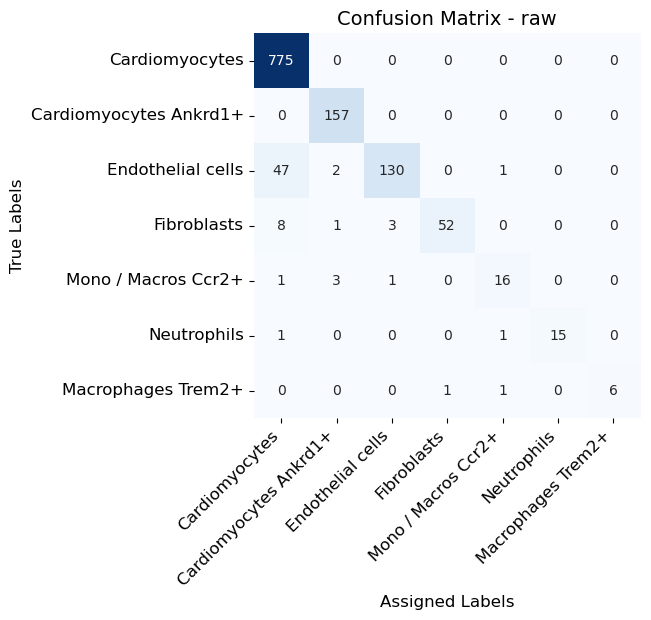

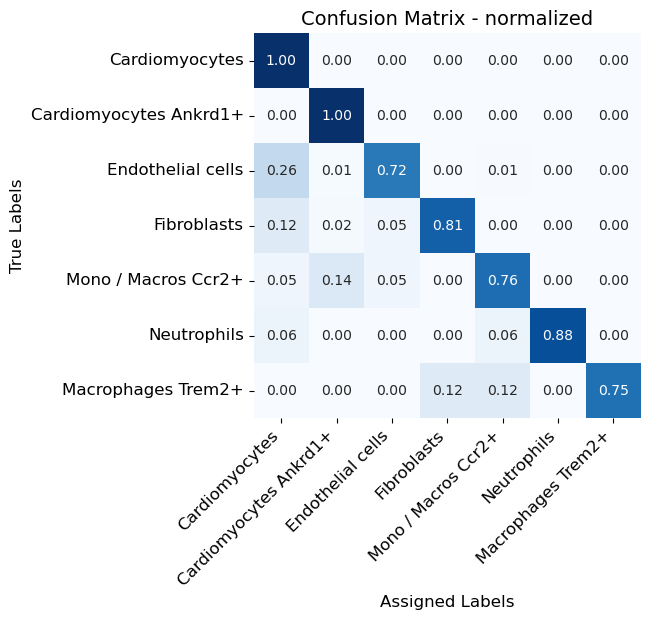

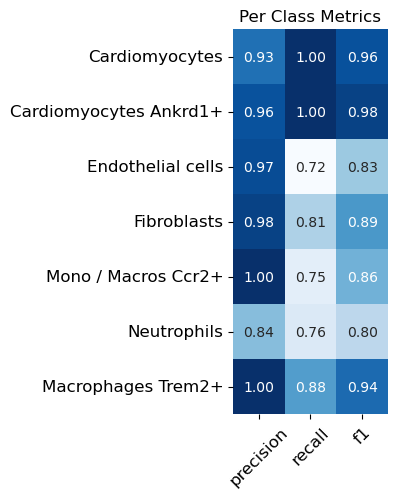

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.utils.multiclass import unique_labels
import seaborn as sns
import matplotlib.pyplot as plt

min_threshold = 10
df = all_crops_df.copy()

value_counts = df['GT_cell_type'].value_counts()
to_exclude = value_counts[value_counts < min_threshold].index

df = df[~df['GT_cell_type'].isin(to_exclude)]
df = df[~df['cell_meta_cluster'].isin(to_exclude)]

# Calculate evaluation metrics
accuracy = accuracy_score(df['GT_cell_type'], df['cell_meta_cluster'])
precision = precision_score(df['GT_cell_type'], df['cell_meta_cluster'], average='weighted')
recall = recall_score(df['GT_cell_type'], df['cell_meta_cluster'], average='weighted')
f1 = f1_score(df['GT_cell_type'], df['cell_meta_cluster'], average='weighted')

# calculate per class precision, recall and f1
per_class_precision = precision_score(df['GT_cell_type'], df['cell_meta_cluster'], average=None)
per_class_recall = recall_score(df['GT_cell_type'], df['cell_meta_cluster'], average=None)
per_class_f1 = f1_score(df['GT_cell_type'], df['cell_meta_cluster'], average=None)

# Print the metrics
print(f"Total cell count: {df.shape[0]}")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"Per Class Precision: {per_class_precision}")
print(f"Per Class Recall: {per_class_recall}")
print(f"Per Class F1 Score: {per_class_f1}")

conf_matrix = confusion_matrix(df['GT_cell_type'], df['cell_meta_cluster'], labels=df.cell_meta_cluster.value_counts().index) # raw

labels = df.cell_meta_cluster.value_counts().index
grid_size = 1
fontsize_axes = 12
plt.figure(figsize=(grid_size * len(labels)-2, grid_size * len(labels)-2))
ax = sns.heatmap(conf_matrix, 
                    xticklabels=labels, 
                    yticklabels=labels, 
                    cmap='Blues', 
                    annot=True, 
                    fmt="d",
                    cbar=False)

ax.set_xticklabels(ax.get_xticklabels(), fontsize=fontsize_axes, rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=fontsize_axes)
ax.set_xlabel('Assigned Labels', fontsize=fontsize_axes)
ax.set_ylabel('True Labels', fontsize=fontsize_axes)

plt.title('Confusion Matrix - raw', fontsize=fontsize_axes + 2)
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/confusion_matrix_raw.png', bbox_inches='tight')
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/confusion_matrix_raw.svg', bbox_inches='tight')
plt.show()

conf_matrix_norm = confusion_matrix(df['GT_cell_type'], df['cell_meta_cluster'], normalize='true', labels=df.cell_meta_cluster.value_counts().index)

labels = df.cell_meta_cluster.value_counts().index
grid_size = 1
fontsize_axes = 12
plt.figure(figsize=(grid_size * len(labels)-2, grid_size * len(labels)-2))
ax = sns.heatmap(conf_matrix_norm, 
                    xticklabels=labels, 
                    yticklabels=labels, 
                    cmap='Blues', 
                    annot=True,
                    fmt='.2f',
                    cbar=False)

ax.set_xticklabels(ax.get_xticklabels(), fontsize=fontsize_axes, rotation=45, ha='right')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=fontsize_axes)
ax.set_xlabel('Assigned Labels', fontsize=fontsize_axes)
ax.set_ylabel('True Labels', fontsize=fontsize_axes)

plt.title('Confusion Matrix - normalized', fontsize=fontsize_axes + 2)
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/confusion_matrix_normalized.png', bbox_inches='tight')
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/confusion_matrix_normalized.svg', bbox_inches='tight')
plt.show()

# create heatmap per class (in columns) with the per-class recall, per-class precision and per-class f1 in rows
per_class_metrics = pd.DataFrame({'precision': per_class_precision, 'recall': per_class_recall, 'f1': per_class_f1})

y_labels = df.cell_meta_cluster.value_counts().index
x_labels = per_class_metrics.columns.values
grid_size = 1
fontsize_axes = 12
plt.figure(figsize=(grid_size * len(x_labels)-1, grid_size * len(y_labels)-2))
ax = sns.heatmap(per_class_metrics, 
                    xticklabels=x_labels, 
                    yticklabels=y_labels, 
                    cmap='Blues', 
                    annot=True,
                    fmt='.2f',
                    cbar=False)

ax.set_xticklabels(ax.get_xticklabels(), fontsize=fontsize_axes, rotation=45, ha='center')
ax.set_yticklabels(ax.get_yticklabels(), fontsize=fontsize_axes)
plt.title('Per Class Metrics')
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/per_class_metrics.png', bbox_inches='tight')
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/per_class_metrics.svg', bbox_inches='tight')
plt.show()

### Below is the code needed to create the plots for the Supplementary Figure 3 - deprecated

In [162]:
from skimage import exposure, measure, segmentation
import matplotlib.patches as mpatches
import matplotlib.lines as mlines


GT_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/annotations'
models = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
segmentation_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/data/segmentation'
image_dir = '/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/crops_DAPI_WGA'
samples = ["_".join((os.path.splitext(os.path.basename(file))[0].split('_')[0], os.path.splitext(os.path.basename(file))[0].split('_')[1])) for file in os.listdir(GT_dir)]
samples = list(set(samples))
samples = [sample for sample in samples if sample != '.DS_Store']

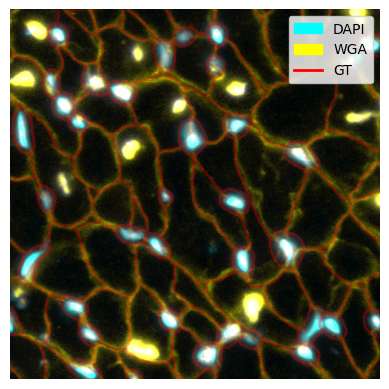

In [164]:
sample = '24h_83'
cropID = 1
image = np.array(tifffile.imread(f'{image_dir}/clahe_{sample}_crop{cropID}.tif'))
GT_segmentation = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))

DAPI_scaling_factor = 1.5
WGA_scaling_factor = 3

DAPI = exposure.rescale_intensity(image[0], out_range=(0, 255*DAPI_scaling_factor))
DAPI[DAPI > 255] = 255
DAPI = DAPI.astype(np.uint8)

WGA = exposure.rescale_intensity(image[1], out_range=(0, 255*WGA_scaling_factor))
WGA[WGA > 255] = 255
WGA = WGA.astype(np.uint8)

# Create an empty RGB image
rgb_image = np.zeros((DAPI.shape[0], DAPI.shape[1], 3), dtype=np.uint8)

# Map the first channel to cyan (green + blue)
rgb_image[..., 1] = DAPI  # Green
rgb_image[..., 2] = DAPI  # Blue

# Map the second channel to yellow (red + green)
rgb_image[..., 0] = WGA  # Red
rgb_image[..., 1] = np.maximum(rgb_image[..., 1], WGA)  # Ensure yellow is dominant

# get contours of the GT_segmentation and set them all to the same value
GT_segmentation = GT_segmentation.astype(np.uint8)
boundaries = segmentation.find_boundaries(GT_segmentation, mode='outer')
plt.contour(boundaries, colors='red', linewidths=1, alpha=0.3)  # Uniform contour intensity

# Custom legend patches
cyan_patch = mpatches.Patch(color='cyan', label='DAPI')
yellow_patch = mpatches.Patch(color='yellow', label='WGA')
red_line = mlines.Line2D([], [], color='red', label='GT', linewidth=2)

# Add the custom legend
plt.legend(handles=[cyan_patch, yellow_patch, red_line], loc='upper right')

# Plot the result
plt.imshow(rgb_image)
plt.axis('off')

plt.savefig("/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/GT_raw.png", dpi=300, bbox_inches='tight')
plt.savefig("/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/GT_raw.svg", bbox_inches='tight')

plt.show()


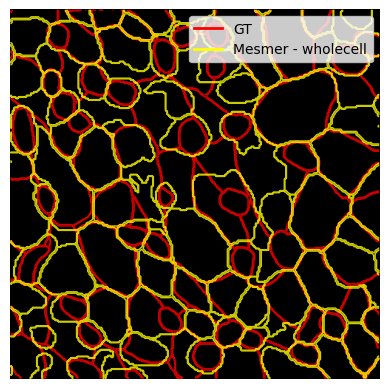

In [176]:
sample = '24h_83'
cropID = 1
model = 'mesmer_wholecell'

seg_tool = model.split('_')[0]
seg_model = model.split('_')[1]

image = np.array(tifffile.imread(f'{image_dir}/clahe_{sample}_crop{cropID}.tif'))
GT_segmentation = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
prediction_segmentation = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
rgb_image = np.zeros((image[0].shape[0], image[0].shape[1], 3), dtype=np.uint8)

# get contours of the GT_segmentation and set them all to the same value
GT_segmentation = GT_segmentation.astype(np.uint8)
boundaries = segmentation.find_boundaries(GT_segmentation, mode='outer')
plt.contour(boundaries, colors='red', linewidths=1, alpha=0.8)  # Uniform contour intensity

prediction_segmentation = prediction_segmentation.astype(np.uint8)
boundaries_prediction = segmentation.find_boundaries(prediction_segmentation, mode='outer')
plt.contour(boundaries_prediction, colors='yellow', linewidths=1, alpha=0.8)  # Uniform contour intensity

# Custom legend patches
red_line = mlines.Line2D([], [], color='red', label='GT', linewidth=2)
lime_line = mlines.Line2D([], [], color='yellow', label=f'{seg_tool.capitalize()} - {seg_model}', linewidth=2)

# Add the custom legend
plt.legend(handles=[red_line, lime_line], loc='upper right')
plt.imshow(rgb_image)
plt.axis('off')

plt.savefig("/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/mesmer_wholecell.png", dpi=300, bbox_inches='tight')
plt.savefig("/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/mesmer_wholecell.svg", bbox_inches='tight')

plt.show()


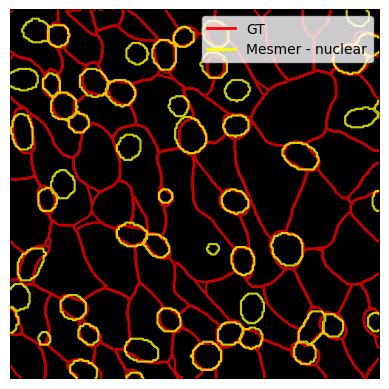

In [175]:
sample = '24h_83'
cropID = 1
model = 'mesmer_nuclear'

seg_tool = model.split('_')[0]
seg_model = model.split('_')[1]

image = np.array(tifffile.imread(f'{image_dir}/clahe_{sample}_crop{cropID}.tif'))
GT_segmentation = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
prediction_segmentation = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
rgb_image = np.zeros((image[0].shape[0], image[0].shape[1], 3), dtype=np.uint8)

# get contours of the GT_segmentation and set them all to the same value
GT_segmentation = GT_segmentation.astype(np.uint8)
boundaries = segmentation.find_boundaries(GT_segmentation, mode='outer')
plt.contour(boundaries, colors='red', linewidths=1, alpha=0.8)  # Uniform contour intensity

prediction_segmentation = prediction_segmentation.astype(np.uint8)
boundaries_prediction = segmentation.find_boundaries(prediction_segmentation, mode='outer')
plt.contour(boundaries_prediction, colors='yellow', linewidths=1, alpha=0.8)  # Uniform contour intensity

# Custom legend patches
red_line = mlines.Line2D([], [], color='red', label='GT', linewidth=2)
lime_line = mlines.Line2D([], [], color='yellow', label=f'{seg_tool.capitalize()} - {seg_model}', linewidth=2)

# Add the custom legend
plt.legend(handles=[red_line, lime_line], loc='upper right')
plt.imshow(rgb_image)
plt.axis('off')

plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/{model}.png", dpi=300, bbox_inches='tight')
plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/{model}.svg", bbox_inches='tight')

plt.show()


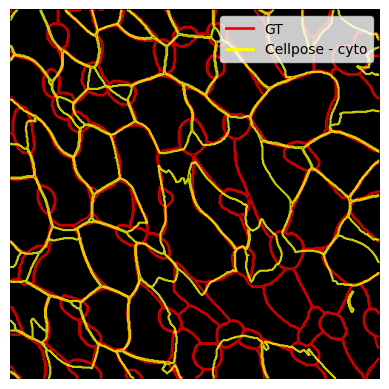

In [177]:
sample = '24h_83'
cropID = 1
model = 'cellpose_cyto'

seg_tool = model.split('_')[0]
seg_model = model.split('_')[1]

image = np.array(tifffile.imread(f'{image_dir}/clahe_{sample}_crop{cropID}.tif'))
GT_segmentation = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
prediction_segmentation = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
rgb_image = np.zeros((image[0].shape[0], image[0].shape[1], 3), dtype=np.uint8)

# get contours of the GT_segmentation and set them all to the same value
GT_segmentation = GT_segmentation.astype(np.uint8)
boundaries = segmentation.find_boundaries(GT_segmentation, mode='outer')
plt.contour(boundaries, colors='red', linewidths=1, alpha=0.8)  # Uniform contour intensity

prediction_segmentation = prediction_segmentation.astype(np.uint8)
boundaries_prediction = segmentation.find_boundaries(prediction_segmentation, mode='outer')
plt.contour(boundaries_prediction, colors='yellow', linewidths=1, alpha=0.8)  # Uniform contour intensity

# Custom legend patches
red_line = mlines.Line2D([], [], color='red', label='GT', linewidth=2)
lime_line = mlines.Line2D([], [], color='yellow', label=f'{seg_tool.capitalize()} - {seg_model}', linewidth=2)

# Add the custom legend
plt.legend(handles=[red_line, lime_line], loc='upper right')
plt.imshow(rgb_image)
plt.axis('off')

plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/{model}.png", dpi=300, bbox_inches='tight')
plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/{model}.svg", bbox_inches='tight')

plt.show()


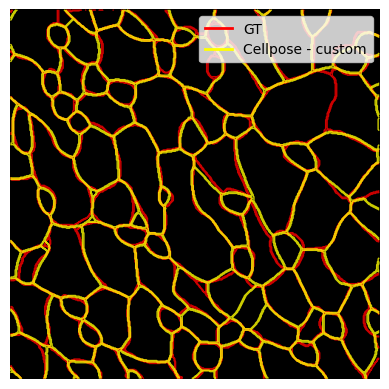

In [178]:
sample = '24h_83'
cropID = 1
model = 'cellpose_custom'

seg_tool = model.split('_')[0]
seg_model = model.split('_')[1]

image = np.array(tifffile.imread(f'{image_dir}/clahe_{sample}_crop{cropID}.tif'))
GT_segmentation = np.array(tifffile.imread(f'{GT_dir}/{sample}_GT_crop{cropID}.tif'))
prediction_segmentation = np.array(tifffile.imread(f'{segmentation_dir}/{seg_tool}_{sample}_{seg_model}_crop{cropID}.tif'))
rgb_image = np.zeros((image[0].shape[0], image[0].shape[1], 3), dtype=np.uint8)

# get contours of the GT_segmentation and set them all to the same value
GT_segmentation = GT_segmentation.astype(np.uint8)
boundaries = segmentation.find_boundaries(GT_segmentation, mode='outer')
plt.contour(boundaries, colors='red', linewidths=1, alpha=0.8)  # Uniform contour intensity

prediction_segmentation = prediction_segmentation.astype(np.uint8)
boundaries_prediction = segmentation.find_boundaries(prediction_segmentation, mode='outer')
plt.contour(boundaries_prediction, colors='yellow', linewidths=1, alpha=0.8)  # Uniform contour intensity

# Custom legend patches
red_line = mlines.Line2D([], [], color='red', label='GT', linewidth=2)
lime_line = mlines.Line2D([], [], color='yellow', label=f'{seg_tool.capitalize()} - {seg_model}', linewidth=2)

# Add the custom legend
plt.legend(handles=[red_line, lime_line], loc='upper right')
plt.imshow(rgb_image)
plt.axis('off')

plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/{model}.png", dpi=300, bbox_inches='tight')
plt.savefig(f"/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/segmentation_images/{model}.svg", bbox_inches='tight')

plt.show()


# Code to create the segmented area, total area and segmentation percentage metrics based on annotated regions

In [1]:
import numpy as np
import tifffile
import zarr
import dask.array
import pandas as pd
from skimage import measure


def filter_segmentation_mask(segmentation_mask, cell_df):

    minimum_cell_size = 120 # exact value in micrometers as used in Molecular Cartography data processing 200 * 0.138 / 0.23 = 120 (200 px * 0.138 um/px (MC pixel size) / 0.23 um/px (COMET PA pixel size)= 120 um)
    maximum_cell_size = 120000 # exact value in micrometers as used in Molecular Cartography data processing

    exclude_cells = cell_df[(cell_df['Eccentricity'] > 0.9) & (cell_df['Solidity'] < 0.9) & (cell_df['cell_size'] < 500)].label.values
    exclude_cells = np.concatenate((exclude_cells, cell_df[(cell_df['cell_size'] < minimum_cell_size) | (cell_df['Solidity'] < 0.1) | (cell_df['cell_size'] > maximum_cell_size) ].label.values))
    # exclude also label.values of cells with region 1, 4 or 8
    exclude_cells = np.concatenate((exclude_cells, cell_df[(cell_df['region'] == 1) | (cell_df['region'] == 4) | (cell_df['region'] == 8)].label.values))
    exclude_cells = np.unique(exclude_cells)

    mask = np.isin(segmentation_mask, exclude_cells)
    segmentation_mask[mask] = 0

    return segmentation_mask

In [2]:
sample_list = ["Control_12", "Control_13", "Control_14", "4h_96", "4h_97", "24h_83", "24h_86", "48h_76", "48h_79"]
segmentation_methods = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']

sample_matching = pd.read_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/sample_name_matching.csv')
sample_list_final = [sample_matching.loc[sample_matching['sample_kb'] == sample, 'sample_final'].values[0] for sample in sample_list]
image_path_list = [sample_matching.loc[sample_matching['sample_kb'] == sample, 'image_path'].values[0] for sample in sample_list]

cell_data = pd.read_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/cell_table_final.csv')

In [ ]:
segmentation_coverage = pd.DataFrame(columns=['sample', 'segmentation_method', 'cardiac_area', 'cardiac_area_mm2', 'segmented_area', 'segmented_area_mm2', 'coverage', 'num_cells'])

for sample in sample_list:
    print(f'Processing sample: {sample}')
    sample_final_name = sample_list_final[sample_list.index(sample)]
    image_path = image_path_list[sample_list.index(sample)]

    region_mask_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/labeled_masks/region_masks/{sample}_regions.tif'
    endocardium_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/labeled_masks/region_masks/{sample}_endocardium.tif'
    lumen_layer_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/labeled_masks/lumen_expanded_masks/{sample}_lumen_layers.tif'
    injury_mask_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/labeled_masks/region_masks/{sample}_injury.tif'
    reannotated_regions_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/labeled_masks/reannotated/masks/{sample}_regions.tif'
    markers_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/marker_files/AF_corrected/{sample}_markers.csv'
    markers = pd.read_csv(markers_path)

    region_mask = np.array(tifffile.imread(reannotated_regions_path))

    region_mask_binary = np.where((region_mask != 1) & (region_mask != 4) & (region_mask != 8), 1, 0)

    print(f'region mask processed')

    cardiac_area = np.sum(region_mask_binary)  
    cardiac_area_mm = cardiac_area * 0.00023**2

    for segmentation_method in segmentation_methods:
        print(f'processing segmentation method: {segmentation_method}')
        seg_tool = segmentation_method.split('_')[0]
        seg_model = segmentation_method.split('_')[1]
        if segmentation_method == 'cellpose_custom':
            segmentation_mask_path = f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/labeled_masks/segmentation/cellpose_lunaphore/{sample}_clahe.ome_cp_masks.tif'
        else:
            segmentation_mask_path = f'/Volumes/Luna_heart/Segmentation/comparison/{segmentation_method}/{sample.lower()}_{segmentation_method}.tif'
        
        segmentation_mask = np.array(tifffile.imread(segmentation_mask_path))

        props = measure.regionprops(segmentation_mask)
        cell_sizes = [prop.area for prop in props]
        solidities = [prop.solidity for prop in props]
        eccentricities = [prop.eccentricity for prop in props]
        labels = [prop.label for prop in props]
        centroids = [prop.centroid for prop in props]
        regions = [region_mask[int(centroid[0]), int(centroid[1])] for centroid in centroids]

        cell_df = pd.DataFrame({'cell_size': cell_sizes, 'Solidity': solidities, 'Eccentricity': eccentricities, 'label': labels, 'centroid': centroids, 'region': regions})

        print(f'region props calculated')

        segmentation_mask = filter_segmentation_mask(segmentation_mask, cell_df)
        num_cells = len(set(np.unique(segmentation_mask)) - {0})

        print(f'Filtered mask')

        segmented_area = np.sum(np.logical_and(segmentation_mask > 0, region_mask_binary))
        segmented_area_mm = segmented_area * 0.00023**2
        coverage = segmented_area / cardiac_area

        segmentation_coverage = pd.concat([segmentation_coverage, pd.DataFrame({
            'sample': [sample], 
            'segmentation_method': [segmentation_method], 
            'cardiac_area': [cardiac_area], 
            'cardiac_area_mm2': [cardiac_area_mm],
            'segmented_area': [segmented_area],
            'segmented_area_mm2': [segmented_area_mm],
            'coverage': [coverage],
            'num_cells': [num_cells]})])

        print(f'Processed segmentation method: {segmentation_method}')
segmentation_coverage.to_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/segmentation_coverage.csv', index=False)

Processing sample: Control_12
region mask processed
processing segmentation method: mesmer_nuclear
region props calculated
Filtered mask


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_67786/1933387397.py:57: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  segmentation_coverage = pd.concat([segmentation_coverage, pd.DataFrame({


Processed segmentation method: mesmer_nuclear
processing segmentation method: mesmer_wholecell
region props calculated
Filtered mask
Processed segmentation method: mesmer_wholecell
processing segmentation method: cellpose_cyto
region props calculated
Filtered mask
Processed segmentation method: cellpose_cyto
processing segmentation method: cellpose_custom
region props calculated
Filtered mask
Processed segmentation method: cellpose_custom
Processing sample: Control_13
region mask processed
processing segmentation method: mesmer_nuclear
region props calculated
Filtered mask
Processed segmentation method: mesmer_nuclear
processing segmentation method: mesmer_wholecell
region props calculated
Filtered mask
Processed segmentation method: mesmer_wholecell
processing segmentation method: cellpose_cyto
region props calculated
Filtered mask
Processed segmentation method: cellpose_cyto
processing segmentation method: cellpose_custom
region props calculated
Filtered mask
Processed segmentation m

In [ ]:
# plot segmentation coverage acros all samples
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

segmentation_methods = ['mesmer_nuclear', 'mesmer_wholecell', 'cellpose_cyto', 'cellpose_custom']
df = pd.read_csv(f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/Molkart_QC_output/{segmentation_methods[0]}_final_QC.all_samples.csv')
spot_assign_coverage = pd.DataFrame(columns=df.columns)
for segmentation in segmentation_methods:
    df = pd.read_csv(f'/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/Molkart_QC_output/{segmentation}_final_QC.all_samples.csv')
    print(f'{segmentation}')
    df['sample_id'] = [x[0] for x in df['sample_id'].str.rsplit('_', n=1)]
    df['sample_id'] = [x[1] for x in df['sample_id'].str.split('_', n=1)]
    df['segmentation_method'] = segmentation

    spot_assign_coverage = pd.concat([spot_assign_coverage, df])
spot_assign_coverage.to_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/assigned_spots_coverage.csv', index=False)

mesmer_nuclear
mesmer_wholecell
cellpose_cyto
cellpose_custom


/var/folders/l7/tt9m66c9577c9x90t8n3xc6m0000gn/T/ipykernel_33594/2745200470.py:16: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  spot_assign_coverage = pd.concat([spot_assign_coverage, df])


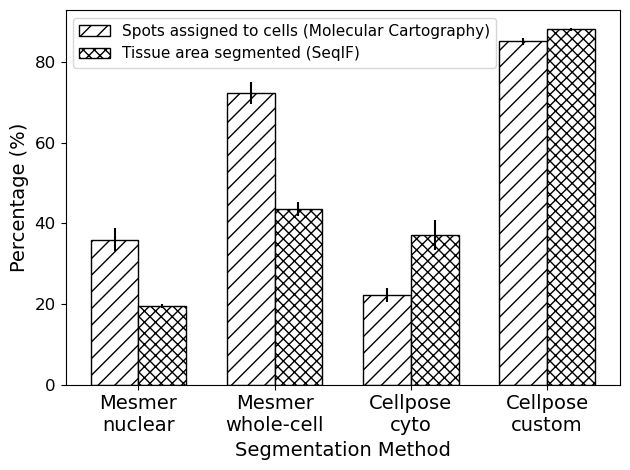

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Example DataFrames for spot_assign_percent and area_covered
segmentation_coverage = pd.read_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/segmentation_coverage.csv')
segmentation_coverage['coverage'] = segmentation_coverage['coverage'] * 100
spot_assign_coverage = pd.read_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/assigned_spots_coverage.csv')


# Calculate mean and standard error for both datasets (assuming more rows in real data)
df1_stats = spot_assign_coverage.groupby('segmentation_method')['spot_assign_percent'].agg(['mean', 'sem']).reset_index()
df2_stats = segmentation_coverage.groupby('segmentation_method')['coverage'].agg(['mean', 'sem']).reset_index()

# Merge the two DataFrames on segmentation_method for consistent x-axis categories
combined_stats = pd.merge(df1_stats, df2_stats, on='segmentation_method', how='outer', suffixes=('_spot', '_area'))

# Plotting
bar_width = 0.35
index = np.arange(len(combined_stats['segmentation_method']))

# reorder x axis as ['Mesmer nuclear', 'Mesmer whole-cell', 'Cellpose cyto', 'Cellpose custom']
combined_stats = combined_stats.reindex([2, 3, 1, 0])
fig, ax = plt.subplots()

# Plot spot_assign_percent
bar1 = ax.bar(index, combined_stats['mean_spot'], bar_width, yerr=combined_stats['sem_spot'], 
              label='Spot Assign Percent', hatch='//', color='white', edgecolor='black')

# Plot area_covered
bar2 = ax.bar(index + bar_width, combined_stats['mean_area'], bar_width, yerr=combined_stats['sem_area'], 
              label='Area Covered', hatch='xxx', color='white', edgecolor='black')

# Customize the plot
ax.set_xlabel('Segmentation Method', fontsize=14)
ax.set_ylabel('Percentage (%)', fontsize=14)
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(['Mesmer\nnuclear', 'Mesmer\nwhole-cell', 'Cellpose\ncyto', 'Cellpose\ncustom'])
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='x', labelsize=14)


# rename the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=['Spots assigned to cells (Molecular Cartography)', 'Tissue area segmented (SeqIF)'], fontsize=11)


# Display the plot
plt.tight_layout()
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/overall_segmentation_coverage_fontsize.png', bbox_inches='tight', dpi=300)
plt.savefig('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/segmentation_evaluation/plots/overall_segmentation_coverage_fontsize.svg', bbox_inches='tight', format='svg')
plt.show()